## <p style="background-color:yellow;color:black;font-size:120%;text-align:center;border-radius:10px 10px;font-weight:bold;border:0px solid #800080;">SharkTank India (Season 1,2,3) Exploratory Data Analysis (EDA) 🦈</p>

## ⚒️ Importing Required Python Libraries

In [2]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

import matplotlib.pyplot as plt
import seaborn as sns
from babel.numbers import format_currency
from wordcloud import WordCloud, STOPWORDS
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
pio.renderers.default = 'notebook'

## ⏳ Check and import dataset

In [3]:
shark_tank = pd.read_csv('Shark Tank India.csv', encoding = "ISO-8859-1")
 
nRow, nCol = shark_tank.shape
print(f'\nThere are {nRow} rows and {nCol} columns in the dataset')


There are 411 rows and 78 columns in the dataset


## 💵 Exploratory Data Analysis (EDA)

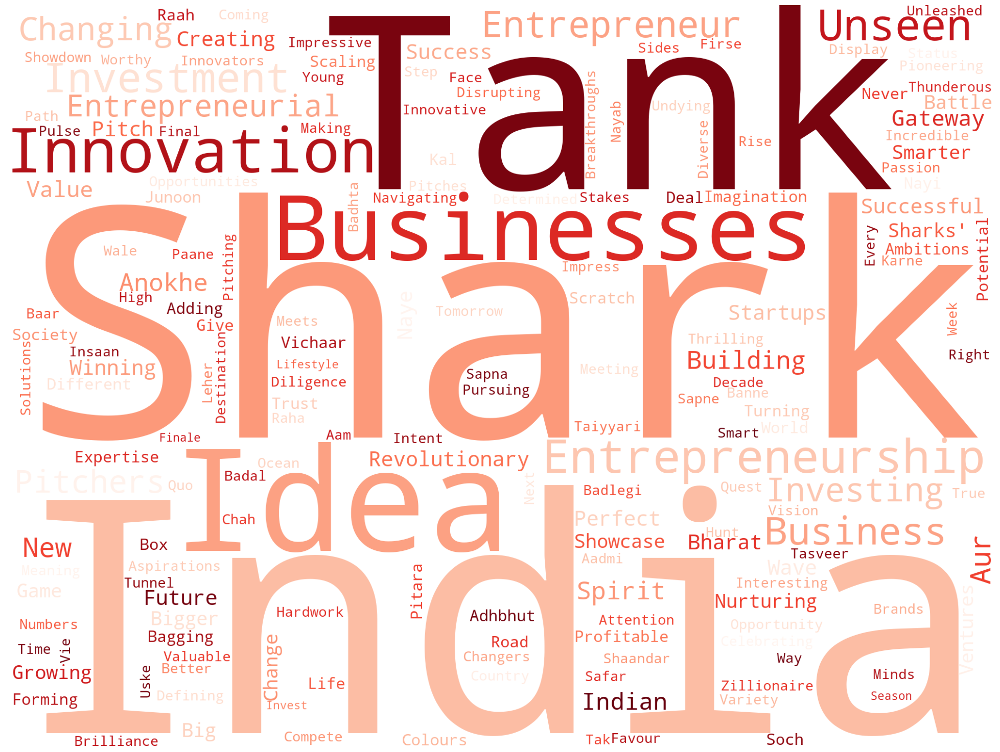

In [4]:
# Word cloud based on episode titles
text = " Shark Tank India ".join(cat for cat in shark_tank.loc[shark_tank['Episode Title'].notnull()]['Episode Title'])
stop_words = list(STOPWORDS) + ["Ka", "Ki", "Ke", "Ko", "Se", "Hai", "Ek"]
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='white', colormap='Reds', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [5]:
shark_tank.head(5)

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
0,1,BluePineFoods,1,1,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Food,Frozen Momos,https://bluepinefoods.com/,2016.0,3,2.0,1.0,NaN,0.0,Middle,Delhi,Delhi,95.0,8.0,NaN,NaN,...,25.0,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,5.33,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
1,1,BoozScooters,1,2,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Vehicles/Electrical Vehicles,Renting e-bike for mobility in private spaces,https://www.boozup.net/,2017.0,1,1.0,NaN,NaN,0.0,Young,Ahmedabad,Gujarat,4.0,0.4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,25.00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
2,1,HeartUpMySleeves,1,3,20-Dec-21,4-Feb-22,20-Dec-21,Badlegi Business Ki Tasveer,Rannvijay Singh,Beauty/Fashion,Detachable Sleeves,https://heartupmysleeves.com/,2021.0,1,NaN,1.0,NaN,0.0,Young,Delhi,Delhi,NaN,2.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
3,1,TagzFoods,2,4,20-Dec-21,4-Feb-22,NaN,"Insaan, Ideas Aur Sapne",Rannvijay Singh,Food,Healthy Potato Chips Snacks,https://tagzfoods.com/,2019.0,2,2.0,NaN,NaN,0.0,Middle,Bangalore,Karnataka,700.0,NaN,48.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.0,2.75,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
4,1,HeadAndHeart,2,5,20-Dec-21,4-Feb-22,NaN,"Insaan, Ideas Aur Sapne",Rannvijay Singh,Education,Brain Development Course,https://thehnh.in/,2015.0,4,1.0,3.0,NaN,1.0,Middle,Patiala,Punjab,30.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN


In [91]:
shark_tank.tail(5).T

,406,407,408,409,410
Season Number,3,3,3,3,3
Startup Name,Cervicheck,Eatverse,AvataarSkincare,ChalteFirteMangalkaryalay,KryzenBiotech
Episode Number,29,29,30,30,30
Pitch Number,407,408,409,410,411
Season Start,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24,22-Jan-24
...,...,...,...,...,...
Aman Present,1.0,1.0,1.0,1.0,1.0
Peyush Present,NaN,NaN,1.0,1.0,1.0
Amit Present,1.0,1.0,NaN,NaN,NaN
Ashneer Present,NaN,NaN,NaN,NaN,NaN


In [7]:
shark_tank['Season Number'] = shark_tank['Season Number'].astype(pd.Int32Dtype())
shark_tank['Episode Number'] = shark_tank['Episode Number'].astype(pd.Int32Dtype())
shark_tank['Pitch Number'] = shark_tank['Pitch Number'].astype(pd.Int32Dtype())

shark_tank['Number of Presenters'] = shark_tank['Number of Presenters'].astype(pd.Int32Dtype())
shark_tank['Male Presenters'] = shark_tank['Male Presenters'].astype(pd.Int32Dtype())
shark_tank['Female Presenters'] = shark_tank['Female Presenters'].astype(pd.Int32Dtype())
shark_tank['Transgender Presenters'] = shark_tank['Transgender Presenters'].astype(pd.Int32Dtype())
shark_tank['Couple Presenters'] = shark_tank['Couple Presenters'].astype(pd.Int32Dtype())

shark_tank['Gross Margin'] = shark_tank['Gross Margin'].astype(pd.Int32Dtype())
shark_tank['Net Margin'] = shark_tank['Net Margin'].astype(pd.Int32Dtype())

shark_tank['Started in'] = shark_tank['Started in'].astype(pd.Int32Dtype())
shark_tank['Yearly Revenue'] = shark_tank['Yearly Revenue'].astype(pd.Int32Dtype())

shark_tank['Received Offer'] = shark_tank['Received Offer'].astype(pd.Int32Dtype())
shark_tank['Accepted Offer'] = shark_tank['Accepted Offer'].astype(pd.Int32Dtype())

In [8]:
shark_tank.sample(10).style.set_properties(**{"background-color": "#2a9d8f","color":"white","border": "1px solid black", 'font-size': '10pt'})

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,EBITDA,Cash Burn,SKUs,Has Patents,Bootstrapped,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Total Deal Debt,Debt Interest,Deal Valuation,Number of Sharks in Deal,Deal Has Conditions,Royalty Deal,Advisory Shares Equity,Namita Investment Amount,Namita Investment Equity,Namita Debt Amount,Vineeta Investment Amount,Vineeta Investment Equity,Vineeta Debt Amount,Anupam Investment Amount,Anupam Investment Equity,Anupam Debt Amount,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
50,1,FindYourKicksIndia,17,51,20-Dec-21,4-Feb-22,nan,A Wave Of Startups,Rannvijay Singh,Beauty/Fashion,Sneaker Resale,https://findyourkicksindia.co/,2021,3,3,,,0,Young,Ludhiana,Punjab,,3.500000,,,nan,nan,nan,nan,nan,50.000000,10.000000,500.000000,1,1,50.000000,25.000000,nan,nan,200.000000,5.000000,nan,nan,nan,10.000000,5.000000,nan,nan,nan,nan,10.000000,5.000000,nan,10.000000,5.000000,nan,10.000000,5.000000,nan,nan,nan,nan,10.000000,5.000000,nan,nan,nan,nan,nan,nan,1.000000,nan,1.000000,1.000000,1.000000,nan,1.000000,nan
410,3,KryzenBiotech,30,411,22-Jan-24,nan,1-Mar-24,Startups Pursuing Investment,Rahul Dua,Agriculture,Hydrophonic Farming,https://www.kryzen.com/,2019,2,1,1,,1,Middle,Pune,Maharashtra,225,nan,,,nan,nan,nan,nan,nan,75.000000,3.000000,2500.000000,1,1,75.000000,15.000000,nan,nan,500.000000,1.000000,nan,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,75.000000,15.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan,nan,nan
238,2,CloudWorx,28,239,2-Jan-23,10-Mar-23,nan,Game Changers,Rahul Dua,Technology/Software,NoCode Enterprise Metaverse App Builder,http://www.cloudworx.ai/,,1,1,,,0,Middle,Bangalore,Karnataka,,14.000000,,,nan,nan,nan,nan,nan,40.000000,2.000000,2000.000000,1,1,40.000000,3.200000,nan,nan,1250.000000,2.000000,yes,nan,nan,20.000000,1.600000,nan,nan,nan,nan,20.000000,1.600000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,1.000000,nan,nan
10,1,JhaJiAchaar,4,11,20-Dec-21,4-Feb-22,nan,Entrepreneurship Ki Wave,Rannvijay Singh,Food,Pickle,https://www.jhajistore.com/,2021,2,,2,,0,Old,Darbhanga,Bihar,,5.000000,18,,nan,nan,nan,nan,nan,50.000000,10.000000,500.000000,1,1,56.600000,5.620000,nan,nan,1007.000000,2.000000,nan,nan,nan,28.300000,2.810000,nan,28.300000,2.810000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,nan,nan,1.000000,nan
399,3,PolishMePretty,27,400,22-Jan-24,nan,27-Feb-24,Entrepreneur's Path To Success,Rahul Dua,Beauty/Fashion,Nail Art Brand,https://www.polishmepretty.in/,2022,1,,1,,0,Young,Pune,Maharashtra,,nan,,,nan,nan,nan,nan,nan,25.000000,25.000000,100.000000,1,1,25.000000,25.000000,nan,nan,100.000000,1.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,25.000000,25.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,1.000000,1.000000,1.000000,1.000000,nan,nan,nan
379,3,ORBO,20,380,22-Jan-24,nan,16-Feb-24,Pioneering Change,Rahul Dua,Technology/Software,AI-powered tools for beauty brands,https://www.orbo.ai/,2019,3,3,

In [9]:
shark_tank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 411 entries, 0 to 410
Data columns (total 78 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Season Number              411 non-null    Int32  
 1   Startup Name               411 non-null    object 
 2   Episode Number             411 non-null    Int32  
 3   Pitch Number               411 non-null    Int32  
 4   Season Start               411 non-null    object 
 5   Season End                 321 non-null    object 
 6   Original Air Date          104 non-null    object 
 7   Episode Title              411 non-null    object 
 8   Anchor                     411 non-null    object 
 9   Industry                   411 non-null    object 
 10  Business Description       411 non-null    object 
 11  Company Website            401 non-null    object 
 12  Started in                 296 non-null    Int32  
 13  Number of Presenters       411 non-null    Int32  

In [10]:
shark_tank.describe().T.round(2).style.background_gradient(cmap = 'Oranges')

,count,mean,std,min,25%,50%,75%,max
Season Number,411.000000,1.849148,0.753281,1.000000,1.000000,2.000000,2.000000,3.000000
Episode Number,411.000000,20.172749,13.831101,0.000000,8.000000,19.000000,30.000000,51.000000
Pitch Number,411.000000,206.000000,118.789730,1.000000,103.500000,206.000000,308.500000,411.000000
Started in,296.000000,2018.733108,2.778803,1998.000000,2017.750000,2019.000000,2020.250000,2023.000000
Number of Presenters,411.000000,2.046229,0.835379,1.000000,1.500000,2.000000,2.000000,6.000000
Male Presenters,356.000000,1.710674,0.844534,1.000000,1.000000,2.000000,2.000000,6.000000
Female Presenters,193.000000,1.186528,0.416364,1.000000,1.000000,1.000000,1.000000,3.000000
Transgender Presenters,3.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Couple Presenters,407.000000,0.184275,0.388186,0.000000,0.000000,0.000000,0.000000,1.000000
Yearly Revenue,189.000000,585.328042,1642.430321,0.000000,75.000000,150.000000,450.000000,18700.000000


In [11]:
# Unique values in each column
for col in shark_tank.columns:
    print("Number of unique values in", col, "-", shark_tank[col].nunique())

Number of unique values in Season Number - 3
Number of unique values in Startup Name - 411
Number of unique values in Episode Number - 52
Number of unique values in Pitch Number - 411
Number of unique values in Season Start - 3
Number of unique values in Season End - 2
Number of unique values in Original Air Date - 34
Number of unique values in Episode Title - 116
Number of unique values in Anchor - 2
Number of unique values in Industry - 16
Number of unique values in Business Description - 408
Number of unique values in Company Website - 401
Number of unique values in Started in - 16
Number of unique values in Number of Presenters - 6
Number of unique values in Male Presenters - 6
Number of unique values in Female Presenters - 3
Number of unique values in Transgender Presenters - 1
Number of unique values in Couple Presenters - 2
Number of unique values in Pitchers Average Age - 3
Number of unique values in Pitchers City - 98
Number of unique values in Pitchers State - 40
Number of un

## 🏦 Season one/two/three of SHARK TANK INDIA was broadcasted in SonyLiv OTT and Sony TV

In [13]:
# Data set information
print(shark_tank['Season Number'].max(), "total seasons in Indian SharkTank \n")
print(shark_tank['Pitch Number'].max(), "#startups came for pitching \n")
print("In Season 1, in", shark_tank_season1['Episode Number'].max(), "episodes, there were", shark_tank_season1.loc[shark_tank_season1['Episode Number']!=0]['Startup Name'].count(), "(real) pitches and", shark_tank_season1.loc[shark_tank_season1['Episode Number']==0]['Startup Name'].count(),"unseen pitches\n")
print("In Season 2, in", shark_tank_season2['Episode Number'].max(), "episodes, there were", shark_tank_season2.loc[shark_tank_season2['Episode Number']!=0]['Startup Name'].count(), "(real) pitches and", shark_tank_season2.loc[shark_tank_season2['Episode Number']==0]['Startup Name'].count(),"unseen pitch\n")
print("In Season 3, in", shark_tank_season3['Episode Number'].max(), "episodes, there were", shark_tank_season3.loc[shark_tank_season3['Episode Number']!=0]['Startup Name'].count(), "(real) pitches\n")

3 total seasons in Indian SharkTank 

411 #startups came for pitching 

In Season 1, in 36 episodes, there were 122 (real) pitches and 30 unseen pitches

In Season 2, in 51 episodes, there were 168 (real) pitches and 1 unseen pitch

In Season 3, in 30 episodes, there were 90 (real) pitches



In [14]:
# Season-wise number of episodes
pd.pivot_table(shark_tank, values='Episode Number', columns='Season Number', aggfunc='max')

Season Number,1,2,3
Episode Number,36,51,30


In [15]:
# There were 2 to 4 pitches, in each episode
print(shark_tank.loc[shark_tank['Episode Number']!=0][['Season Number','Episode Number']].value_counts().sort_values(ascending=True).unique())

[2 3 4]


In [16]:
# Types of industries, came for investment, in all seasons
tmp = shark_tank['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Shark Tank India - Industry wise startups (in all seasons)</b>", template='simple_white', text=tmp, width=820, height=650)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [17]:
# Types of industries, came for investment, in current/latest season (3rd season)
tmp = shark_tank_season3['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Indian Shark Tank in current/latest season (3rd season) - Industry wise startups</b>", template='simple_white', text=tmp, width=830, height=600)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [18]:
# Gender wise
print("Total pitchers -", int(shark_tank['Number of Presenters'].sum()), "\n")
print("")
print("Total male pitchers -", int(shark_tank['Male Presenters'].sum()), "\n")
print("Total female pitchers -", int(shark_tank['Female Presenters'].sum()), "\n")
print("Total transgender pitchers -", int(shark_tank['Transgender Presenters'].sum()), "\n")
print("")
print("COVID entrepreneurs/startups - ", shark_tank.loc[shark_tank['Started in']==2020]['Startup Name'].count(), sep='')

Total pitchers - 841 


Total male pitchers - 609 

Total female pitchers - 229 

Total transgender pitchers - 3 


COVID entrepreneurs/startups - 51


Male entrepreneurs percentage - 72.41%

Female entrepreneurs percentage - 27.23%

Transgender entrepreneurs percentage - 0.36%

Couple entrepreneurs percentage - 9.0%




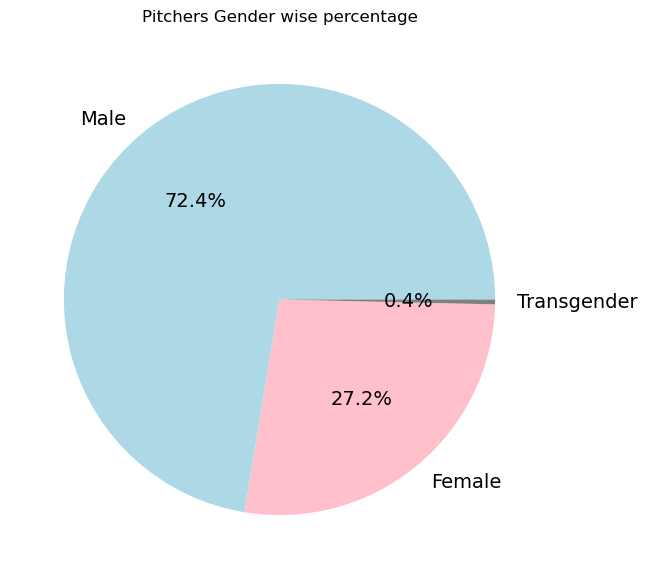

In [19]:
print("Male entrepreneurs percentage - ", round(shark_tank['Male Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Female entrepreneurs percentage - ", round(shark_tank['Female Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Transgender entrepreneurs percentage - ", round(shark_tank['Transgender Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), "%\n", sep='')
print("Couple entrepreneurs percentage - ", round(shark_tank.loc[shark_tank['Couple Presenters']==1]['Couple Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 0), "%\n", sep='')
print("")

fig = plt.figure(figsize =(10, 7))
plt.title("Pitchers Gender wise percentage")
plt.pie([round(shark_tank['Male Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), round(shark_tank['Female Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2), round(shark_tank['Transgender Presenters'].sum()/shark_tank['Number of Presenters'].sum()*100, 2)], labels = ["Male","Female","Transgender"], autopct='%.1f%%', colors=["lightblue", "pink", "gray"], textprops={'fontsize': 14})
plt.show()

Pitchers Average Age
Middle    304
Young     104
Old         3
Name: count, dtype: int64 

Pitchers Average Age
Middle    74%
Young     25%
Old        1%
Name: proportion, dtype: object 



Text(0, 0.5, '')

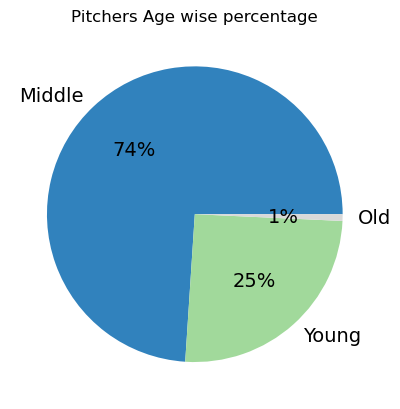

In [20]:
# Age wise
print(shark_tank['Pitchers Average Age'].value_counts(),"\n")

# In percentage
print(round(shark_tank['Pitchers Average Age'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

plt.title("Pitchers Age wise percentage")
shark_tank["Pitchers Average Age"].value_counts().plot(kind='pie', autopct='%.0f%%', cmap='tab20c', fontsize=14)
plt.ylabel('')

### 💹 69% companies received offers and 31% startups could not convince Sharks to invest

Received Offer
1    282
0    129
Name: count, dtype: Int64 

Received Offer
1    69%
0    31%
Name: proportion, dtype: object


Text(0, 0.5, '')

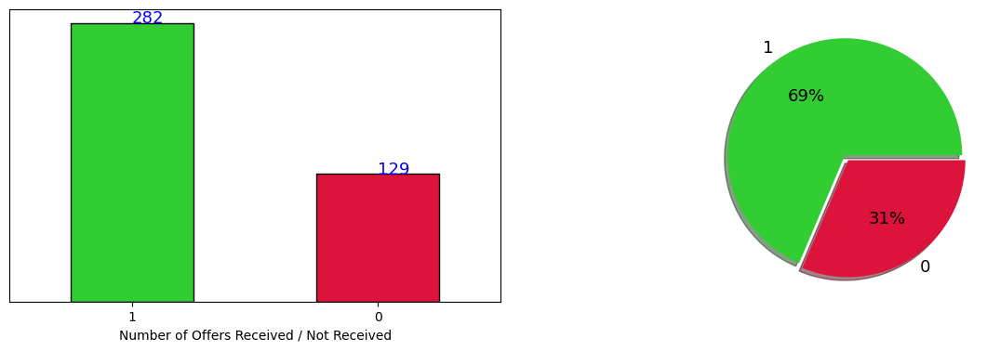

In [21]:
# Offers received
print(shark_tank['Received Offer'].value_counts(), "\n")
print(round(shark_tank['Received Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
shark_tank["Received Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Received / Not Received")
plt.yticks([])
plt.xticks(rotation=0)
for x,y in enumerate(shark_tank["Received Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")
    
ax2 = plt.subplot(222)
shark_tank["Received Offer"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 272 companies received offers & 124 startups could not convince #Sharks to invest.

### ＄ 82% companies accepted offers and 18% startups didn't accept Sharks offer

Accepted Offer
1    230
0     52
Name: count, dtype: Int64 

Accepted Offer
1    82%
0    18%
Name: proportion, dtype: object


Text(0, 0.5, '')

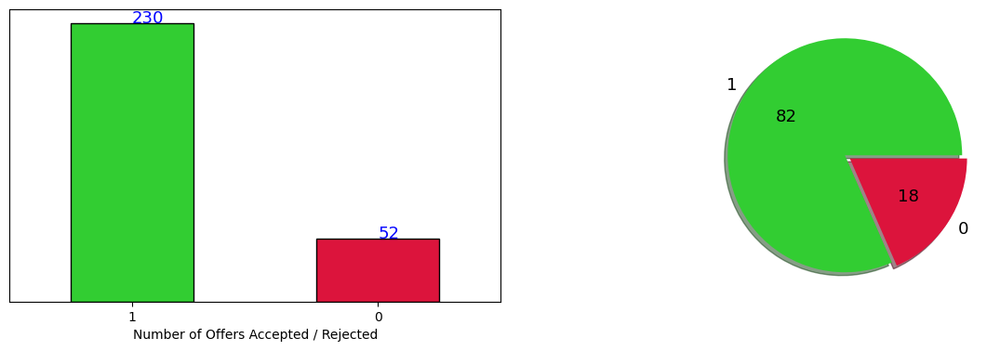

In [22]:
# Offers accepted
print(shark_tank['Accepted Offer'].value_counts(), "\n")
print(round(shark_tank['Accepted Offer'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15, 9))
ax1 = plt.subplot(221)
shark_tank["Accepted Offer"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Accepted / Rejected")
plt.yticks([])
plt.xticks(rotation = 0)
for x,y in enumerate(shark_tank["Accepted Offer"].value_counts()):
    plt.annotate(y, (x,y), fontsize=13, color="blue")
    
ax2 = plt.subplot(222)
shark_tank["Accepted Offer"].value_counts().plot(kind='pie', autopct='%.0f', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=13)
plt.ylabel('')

# 220 companies accepted investments they got & 52 #Startups did not accept Shark's offer.

In [23]:
# Maximum amount requested
print("Maximum amount requested, by a pitcher - Rs.", round(shark_tank["Original Ask Amount"].max()/100), "crores")

Maximum amount requested, by a pitcher - Rs. 300 crores


In [24]:
# Least amount requested
print("Least amount requested, by a pitcher - Rs.", round(shark_tank["Original Ask Amount"].min()*100000))

Least amount requested, by a pitcher - Rs. 0


In [25]:
# Sum of investment amount asked, in Shark Tank, in India
print("Sum of investment amount asked, by all startup companies, in Indian Shark Tank -", format_currency(shark_tank['Original Ask Amount'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Sum of investment amount asked, by all startup companies, in Indian Shark Tank - ₹629.99 crores


In [26]:
# Amount invested by all sharks, in India SharkTank
print("Amount invested by all sharks, in Shark Tank India -", format_currency(shark_tank['Total Deal Amount'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Amount invested by all sharks, in Shark Tank India - ₹156.17 crores


In [27]:
# Sum of loan/debt amount, in India Shark Tank
print("Sum of loan/debt amount, given by all sharks, in India SharkTank -", format_currency(shark_tank['Total Deal Debt'].sum()/100, 'INR', locale='en_IN').replace(".00", ""), "crores")

Sum of loan/debt amount, given by all sharks, in India SharkTank - ₹20.46 crores


In [28]:
# Offers rejected by pitchers/startup companies
print(shark_tank[shark_tank['Accepted Offer']==0]["Startup Name"].count())
shark_tank.loc[shark_tank['Accepted Offer']==0, ["Season Number","Startup Name","Industry","Original Ask Amount","Original Offered Equity"]]

52


,Season Number,Startup Name,Industry,Original Ask Amount,Original Offered Equity
6,1,qZenseLabs,Food,100.0,0.25
19,1,Torch-it,Education,75.0,1.00
21,1,LaKheerDeli,Food,50.0,7.50
27,1,KabiraHandmad,Food,100.0,5.00
41,1,MorrikoPureFoods,Food,100.0,3.00
55,1,IndiaHempandCo,Food,50.0,4.00
60,1,KetoIndia,Food,150.0,1.25
70,1,Moonshine,Food,80.0,0.50
71,1,Falhari,Food,50.0,2.00
73,1,UrbanMonkey,Beauty/Fashion,100.0,1.00


In [29]:
# Top 19 investments (more than 1Cr), as per total investment/deal amount (in lakhs)
print(shark_tank.groupby('Startup Name')['Total Deal Amount'].max().nlargest(19))

tmpdf = shark_tank.sort_values('Total Deal Amount', ascending=False)[0:19]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Amount', color="Startup Name", title="Highest Investment as per deal amount (in lakhs)", text=tmpdf['Total Deal Amount'])
fig.show()

Startup Name
NasherMiles     300.0
WeHear          250.0
DilFoods        200.0
GoenchiFeni     200.0
JewelBox        200.0
MeduLance       200.0
Pharmallama     200.0
Refit           200.0
UnStop          200.0
AasVidyalaya    150.0
Intervue        150.0
Portl           150.0
Snitch          150.0
Stage           150.0
Trunome         150.0
YesMadam        150.0
TURMS           120.0
WiseLife        120.0
MindPeers       106.0
Name: Total Deal Amount, dtype: float64


In [30]:
# Top 20 investments, as per total equity/shares percentage diluted
print(shark_tank.groupby('Startup Name')['Total Deal Equity'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Equity', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Highest Investment as per Equity percentage", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name
Sid07Designs          75.00
BoozScooters          50.00
IsakFragrances        50.00
HammerLifestyle       40.00
KGAgrotech            40.00
TheSassBar            35.00
VivalyfInnovations    33.33
GoldSafeSolutions     30.00
HeartUpMySleeves      30.00
JainShikanji          30.00
ColourMeMad-CMM       25.00
CosIQ                 25.00
FindYourKicksIndia    25.00
HoloKitab             25.00
PNTRobotics           25.00
PolishMePretty        25.00
Raasa                 25.00
LOKA                  24.00
TheQuirkyNaari        24.00
WakaoFoods            21.00
Name: Total Deal Equity, dtype: float64


In [31]:
# Startups who sold more than 1/3rd of their company (equity) to Sharks
print(shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ][["Startup Name"]].count())
print(shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ][["Season Number","Startup Name","Total Deal Amount", "Total Deal Equity"]])

tmpdf = shark_tank.loc[shark_tank['Total Deal Equity'] > 32 ].sort_values('Total Deal Equity', ascending=False)
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold more than 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    7
dtype: int64
    Season Number        Startup Name  Total Deal Amount  Total Deal Equity
1               1        BoozScooters               40.0              50.00
23              1  VivalyfInnovations               56.0              33.33
43              1     HammerLifestyle              100.0              40.00
66              1        Sid07Designs               25.0              75.00
76              1          TheSassBar               50.0              35.00
77              1          KGAgrotech               10.0              40.00
82              1      IsakFragrances               50.0              50.00


In [32]:
# Top 20 investments, as per total debt/loan amount
print(shark_tank.groupby('Startup Name')['Total Deal Debt'].max().nlargest(20))

tmpdf = shark_tank.sort_values('Total Deal Debt', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Debt', color="Startup Name", title="Highest Investment as per Debt amount (in lakhs)", text=tmpdf['Total Deal Debt'])
fig.show()

Startup Name
Stage                150.0
WatchoutWearables    100.0
uBreathe             100.0
Otua                  99.0
Vecros                80.0
Wol3D                 70.0
TAC                   69.0
maisha                65.0
Hood                  60.0
iMumz                 60.0
AyuSynk               50.0
DailyDump             50.0
Freebowler            50.0
GROWiT                50.0
LilGoodness           50.0
NamhyaFoods           50.0
NutriCook             50.0
Rubans                50.0
StoreMyGoods          50.0
Aadvik                45.0
Name: Total Deal Debt, dtype: float64


In [33]:
# Startups who got Debt/loan amount
print("Number of startups who got debt/loan amount", shark_tank['Total Deal Debt'].count(),"\n")
shark_tank.loc[shark_tank['Total Deal Debt'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity","Total Deal Debt"]]

Number of startups who got debt/loan amount 45 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Total Deal Debt
8,1,NOCD,20.0,15.00,30.0
44,1,PNTRobotics,25.0,25.00,25.0
46,1,BambooIndia,50.0,3.50,30.0
56,1,Otua,1.0,1.00,99.0
62,1,TheStatePlate,40.0,3.00,25.0
66,1,Sid07Designs,25.0,75.00,22.0
72,1,NamhyaFoods,50.0,10.00,50.0
77,1,KGAgrotech,10.0,40.00,20.0
120,1,StoreMyGoods,50.0,4.00,50.0
156,2,WatchoutWearables,100.0,10.00,100.0


In [34]:
# Startups who gave Royalty
print("Number of startups who gave Royalty", shark_tank['Royalty Deal'].count(),"\n")

shark_tank.loc[shark_tank['Royalty Deal'] == 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who gave Royalty 13 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
321,3,HonestHome,100.0,3.00
322,3,AdilQadri,100.0,1.00
342,3,Tiggle,50.0,20.00
351,3,GudGum,80.0,10.00
362,3,DecodeAge,100.0,2.25
375,3,YesMadam,150.0,2.00
378,3,PushSports,80.0,4.00
384,3,D'chica,80.0,2.00
385,3,Refit,200.0,1.00
387,3,Artinci,50.0,5.00


In [35]:
# Startups who gave Advisory shares
print("Number of startups who gave Advisory shares/equity", shark_tank['Advisory Shares Equity'].count(),"\n")

shark_tank.loc[shark_tank['Advisory Shares Equity'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

# DATA INCOMPLETE

Number of startups who gave Advisory shares/equity 3 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity
334,3,AIKavach/Panoplia,100.0,2.50,2.5
341,3,WeHear,250.0,1.00,1.5
349,3,Arata,100.0,1.33,0.6


In [36]:
# Deals with conditions
print("Number of startups who accepted for conditional deals", shark_tank['Deal Has Conditions'].count(),"\n")

shark_tank.loc[shark_tank['Deal Has Conditions'] == 'yes'][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

Number of startups who accepted for conditional deals 23 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity
8,1,NOCD,20.0,15.00,NaN
29,1,Meatyour,30.0,20.00,NaN
32,1,ARRCOATSurfaceTextures,50.0,15.00,NaN
44,1,PNTRobotics,25.0,25.00,NaN
79,1,PawsIndia,50.0,15.00,NaN
82,1,IsakFragrances,50.0,50.00,NaN
105,1,GrowFitter,50.0,2.00,NaN
224,2,Amore,75.0,7.50,NaN
238,2,CloudWorx,40.0,3.20,NaN
242,2,Daryaganj,90.0,1.00,NaN


## 💰 Which shark invested most ?

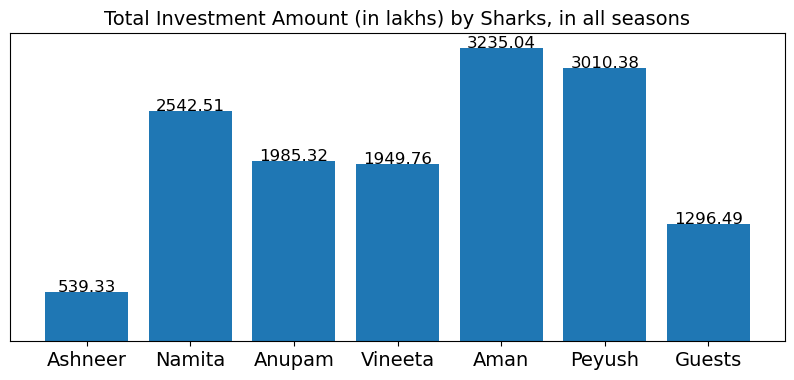

In [37]:
# Amount Invested by sharks, in all seasons
Amount = [shark_tank['Ashneer Investment Amount'].sum(), shark_tank['Namita Investment Amount'].sum(), shark_tank['Anupam Investment Amount'].sum(), shark_tank['Vineeta Investment Amount'].sum(),
    shark_tank['Aman Investment Amount'].sum(), shark_tank['Peyush Investment Amount'].sum(), shark_tank['Guest Investment Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Investment Amount (in lakhs) by Sharks, in all seasons", fontsize=14)
plt.show()

# Aman invested maximum amount, in all seasons - 32 crores
# Asheneer invested minimum amount, in all seasons - 5 crores

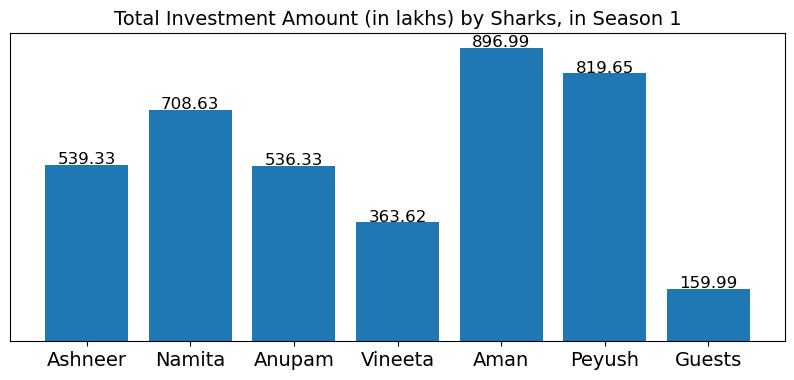

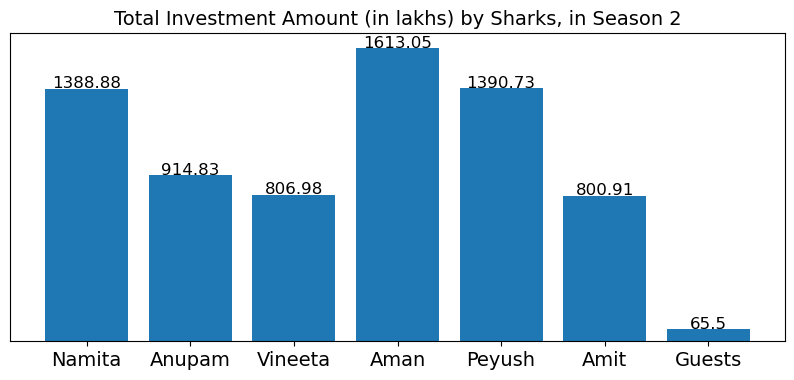

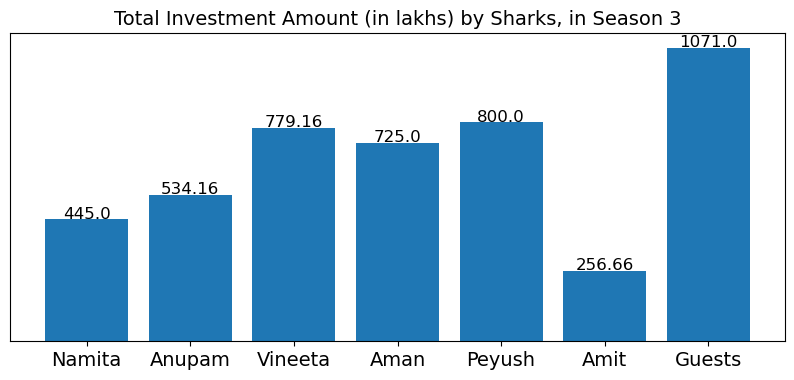

In [38]:
# Amount Invested by sharks
# Season 1
Amount = [shark_tank_season1['Ashneer Investment Amount'].sum(), shark_tank_season1['Namita Investment Amount'].sum(), shark_tank_season1['Anupam Investment Amount'].sum(), shark_tank_season1['Vineeta Investment Amount'].sum(),
    shark_tank_season1['Aman Investment Amount'].sum(), shark_tank_season1['Peyush Investment Amount'].sum(), shark_tank_season1['Guest Investment Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Investment Amount (in lakhs) by Sharks, in Season 1", fontsize=14)
plt.show()

# Season 2
Amount = [shark_tank_season2['Namita Investment Amount'].sum(), shark_tank_season2['Anupam Investment Amount'].sum(), shark_tank_season2['Vineeta Investment Amount'].sum(),
    shark_tank_season2['Aman Investment Amount'].sum(), shark_tank_season2['Peyush Investment Amount'].sum(), shark_tank_season2['Amit Investment Amount'].sum(), shark_tank_season2['Guest Investment Amount'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Investment Amount (in lakhs) by Sharks, in Season 2", fontsize=14)
plt.show()

# Season 3
Amount = [shark_tank_season3['Namita Investment Amount'].sum(), shark_tank_season3['Anupam Investment Amount'].sum(), shark_tank_season3['Vineeta Investment Amount'].sum(),
    shark_tank_season3['Aman Investment Amount'].sum(), shark_tank_season3['Peyush Investment Amount'].sum(), shark_tank_season3['Amit Investment Amount'].sum(), shark_tank_season3['Guest Investment Amount'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Investment Amount (in lakhs) by Sharks, in Season 3", fontsize=14)
plt.show()

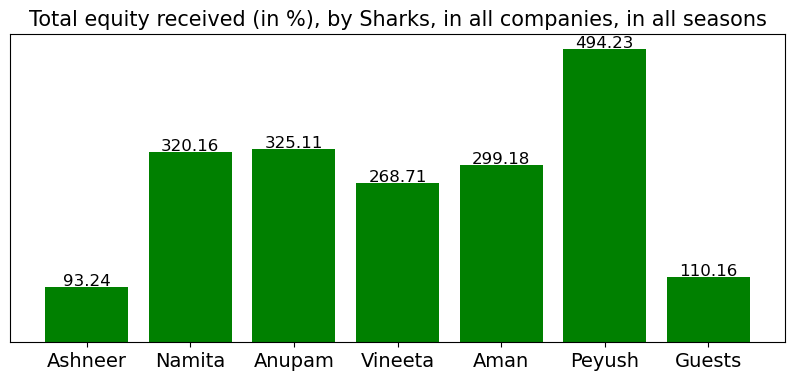

In [39]:
# Equity received by sharks, in all seasons
Amount = [shark_tank['Ashneer Investment Equity'].sum(), shark_tank['Namita Investment Equity'].sum(), shark_tank['Anupam Investment Equity'].sum(), shark_tank['Vineeta Investment Equity'].sum(),
    shark_tank['Aman Investment Equity'].sum(), shark_tank['Peyush Investment Equity'].sum(), shark_tank['Guest Investment Equity'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Equity':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total equity received (in %), by Sharks, in all companies, in all seasons", fontsize=15)
plt.show()

# Peyush got maximum equity of - 494% in different companies, in all seasons
# Ashneer got minimum equity of - 93% in different companies, in all seasons

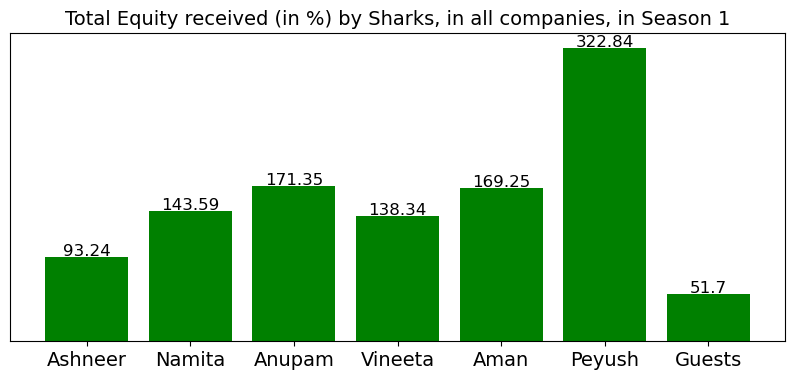

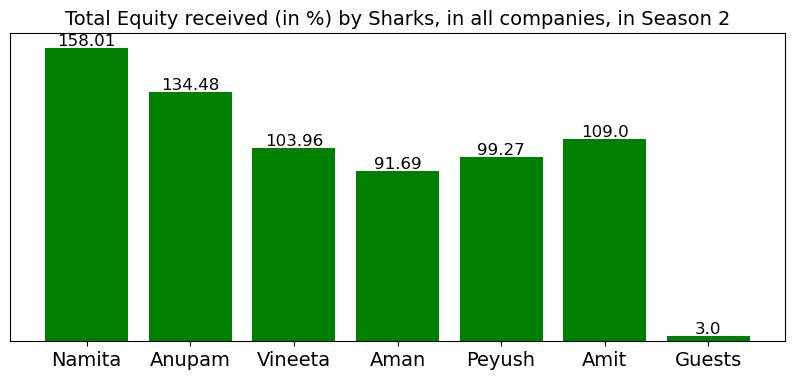

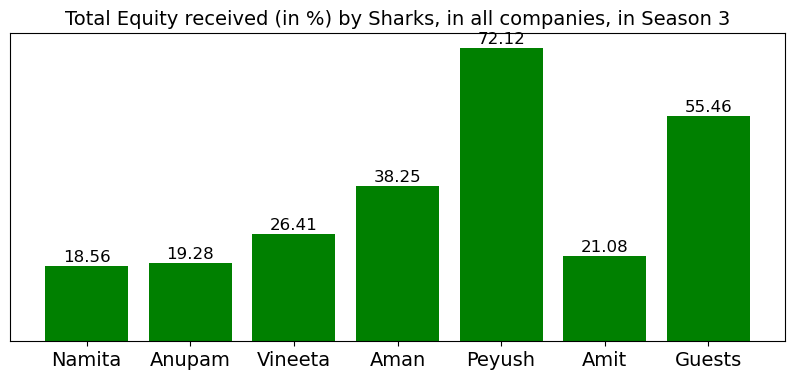

In [40]:
# Equity received by sharks
# Season 1
Equity = [shark_tank_season1['Ashneer Investment Equity'].sum(), shark_tank_season1['Namita Investment Equity'].sum(), shark_tank_season1['Anupam Investment Equity'].sum(), shark_tank_season1['Vineeta Investment Equity'].sum(),
    shark_tank_season1['Aman Investment Equity'].sum(), shark_tank_season1['Peyush Investment Equity'].sum(), shark_tank_season1['Guest Investment Equity'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+1, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Equity received (in %) by Sharks, in all companies, in Season 1", fontsize=14)
plt.show()

# Season 2
Equity = [shark_tank_season2['Namita Investment Equity'].sum(), shark_tank_season2['Anupam Investment Equity'].sum(), shark_tank_season2['Vineeta Investment Equity'].sum(),
    shark_tank_season2['Aman Investment Equity'].sum(), shark_tank_season2['Peyush Investment Equity'].sum(), shark_tank_season2['Amit Investment Equity'].sum(), shark_tank_season2['Guest Investment Equity'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit', 'Guests']
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+1, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Equity received (in %) by Sharks, in all companies, in Season 2", fontsize=14)
plt.show()

# Season 3
Equity = [shark_tank_season3['Namita Investment Equity'].sum(), shark_tank_season3['Anupam Investment Equity'].sum(), shark_tank_season3['Vineeta Investment Equity'].sum(),
    shark_tank_season3['Aman Investment Equity'].sum(), shark_tank_season3['Peyush Investment Equity'].sum(), shark_tank_season3['Amit Investment Equity'].sum(), shark_tank_season3['Guest Investment Equity'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit', 'Guests']
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+1, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Equity received (in %) by Sharks, in all companies, in Season 3", fontsize=14)
plt.show()

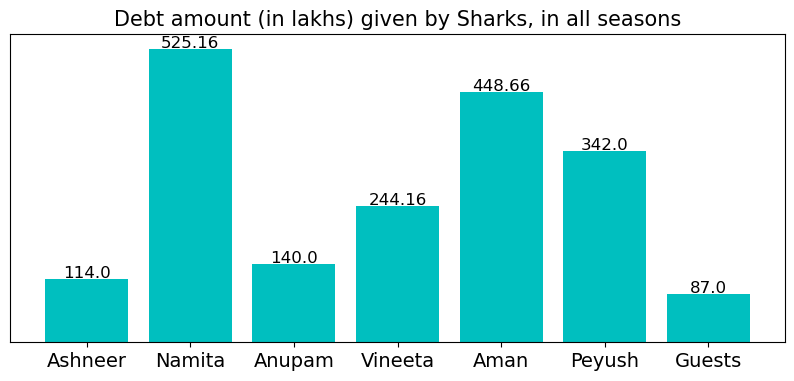

In [41]:
# Investment based on the  Debt/loaned Amount, in all seasons
Amount = [shark_tank['Ashneer Debt Amount'].sum(), shark_tank['Namita Debt Amount'].sum(), shark_tank['Anupam Debt Amount'].sum(), shark_tank['Vineeta Debt Amount'].sum(),
    shark_tank['Aman Debt Amount'].sum(), shark_tank['Peyush Debt Amount'].sum(), shark_tank['Guest Debt Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush', 'Guests']
df = {'Name':name, 'Total Equity':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='c')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Debt amount (in lakhs) given by Sharks, in all seasons", fontsize=15)
plt.show()

# Namita gave maximum debt amount, in all seasons - 5 crores
# All guests gave minimum debt amount, in all seasons - 0.87 crores

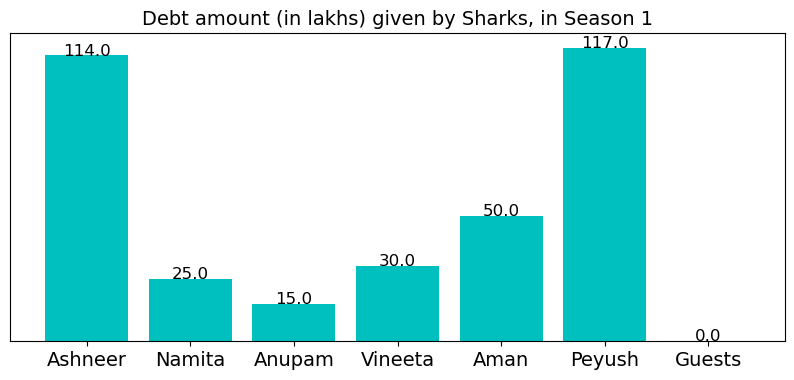

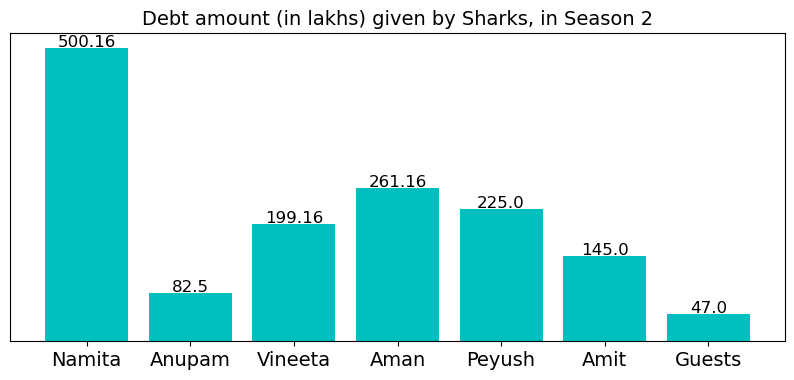

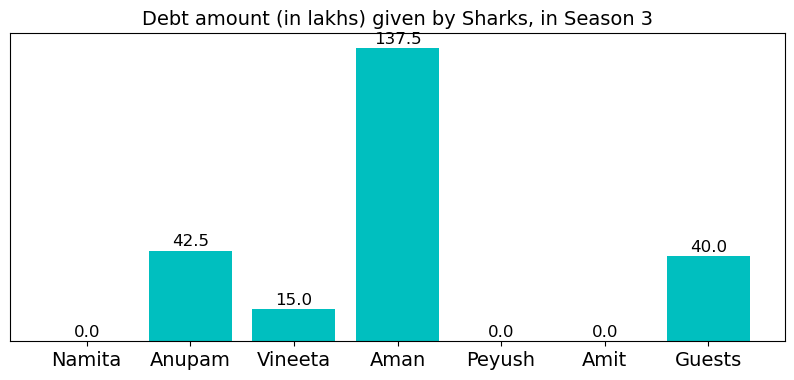

Namita gave 20% higher loan in season 2, compared to season 1
Aman started giving more debt/loan in season3


In [42]:
# Investment based on the  Debt/loaned Amount
# Season 1
debt = [shark_tank_season1['Ashneer Debt Amount'].sum(), shark_tank_season1['Namita Debt Amount'].sum(), shark_tank_season1['Anupam Debt Amount'].sum(), shark_tank_season1['Vineeta Debt Amount'].sum(),
    shark_tank_season1['Aman Debt Amount'].sum(), shark_tank_season1['Peyush Debt Amount'].sum(), shark_tank_season1['Guest Debt Amount'].sum()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total debt':debt}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total debt'], color='c')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(debt):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Debt amount (in lakhs) given by Sharks, in Season 1", fontsize=14)
plt.show()

# Season 2
debt = [shark_tank_season2['Namita Debt Amount'].sum(), shark_tank_season2['Anupam Debt Amount'].sum(), shark_tank_season2['Vineeta Debt Amount'].sum(),
    shark_tank_season2['Aman Debt Amount'].sum(), shark_tank_season2['Peyush Debt Amount'].sum(), shark_tank_season2['Amit Debt Amount'].sum(), shark_tank_season2['Guest Debt Amount'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit', 'Guests']
df = {'Name':name, 'Total debt':debt}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total debt'], color='c')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(debt):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Debt amount (in lakhs) given by Sharks, in Season 2", fontsize=14)
plt.show()

# Season 3
debt = [shark_tank_season3['Namita Debt Amount'].sum(), shark_tank_season3['Anupam Debt Amount'].sum(), shark_tank_season3['Vineeta Debt Amount'].sum(),
    shark_tank_season3['Aman Debt Amount'].sum(), shark_tank_season3['Peyush Debt Amount'].sum(), shark_tank_season3['Amit Debt Amount'].sum(), shark_tank_season3['Guest Debt Amount'].sum()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit', 'Guests']
df = {'Name':name, 'Total debt':debt}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total debt'], color='c')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(debt):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Debt amount (in lakhs) given by Sharks, in Season 3", fontsize=14)
plt.show()

print("Namita gave 20% higher loan in season 2, compared to season 1\nAman started giving more debt/loan in season3")

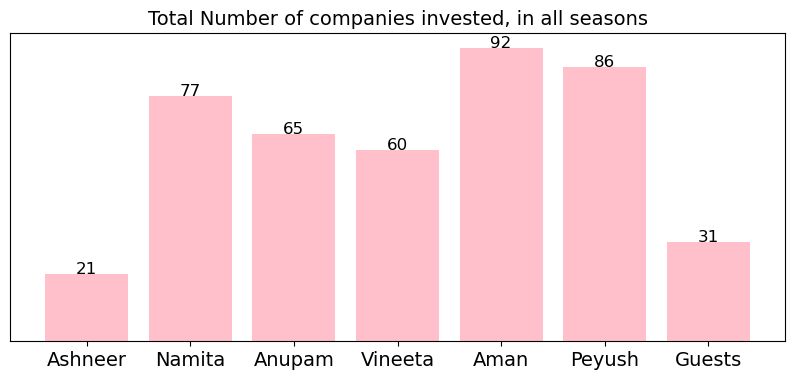

In [43]:
# Number of companies invested, in all seasons
Amount = [shark_tank['Ashneer Investment Amount'].count(), shark_tank['Namita Investment Amount'].count(), shark_tank['Anupam Investment Amount'].count(), shark_tank['Vineeta Investment Amount'].count(),
    shark_tank['Aman Investment Amount'].count(), shark_tank['Peyush Investment Amount'].count(), shark_tank['Guest Investment Amount'].count()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Number of companies invested, in all seasons", fontsize=14)
plt.show()

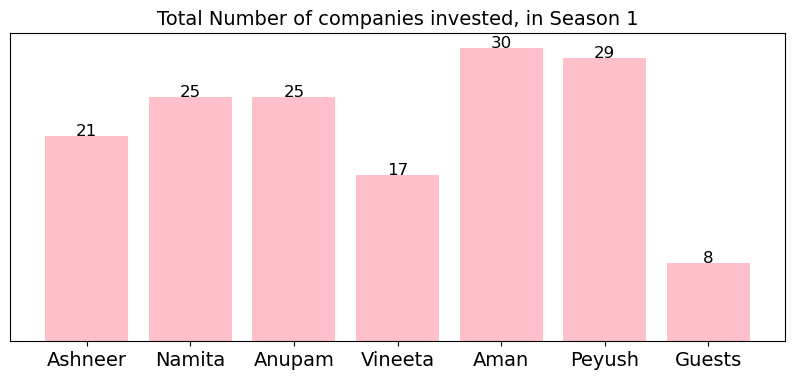

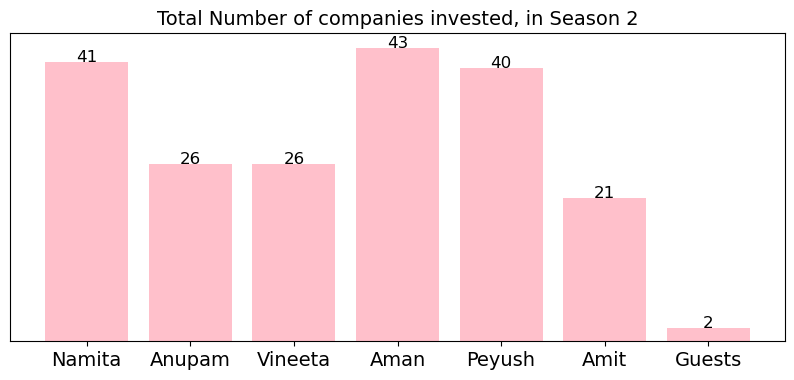

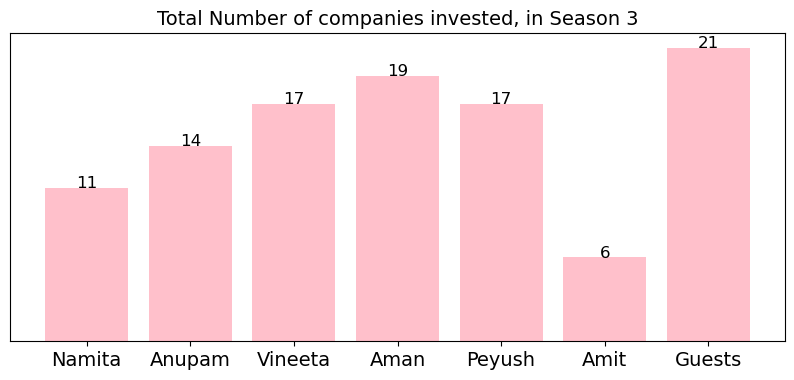

In [44]:
# Number of companies invested
# Season 1
Amount = [shark_tank_season1['Ashneer Investment Amount'].count(), shark_tank_season1['Namita Investment Amount'].count(), shark_tank_season1['Anupam Investment Amount'].count(), shark_tank_season1['Vineeta Investment Amount'].count(),
    shark_tank_season1['Aman Investment Amount'].count(), shark_tank_season1['Peyush Investment Amount'].count(), shark_tank_season1['Guest Investment Amount'].count()]
name=['Ashneer','Namita','Anupam','Vineeta','Aman','Peyush','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Number of companies invested, in Season 1", fontsize=14)
plt.show()

# Season 2
Amount = [shark_tank_season2['Namita Investment Amount'].count(), shark_tank_season2['Anupam Investment Amount'].count(), shark_tank_season2['Vineeta Investment Amount'].count(),
    shark_tank_season2['Aman Investment Amount'].count(), shark_tank_season2['Peyush Investment Amount'].count(), shark_tank_season2['Amit Investment Amount'].count(), shark_tank_season2['Guest Investment Amount'].count()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Number of companies invested, in Season 2", fontsize=14)
plt.show()

# Season 3
Amount = [shark_tank_season3['Namita Investment Amount'].count(), shark_tank_season3['Anupam Investment Amount'].count(), shark_tank_season3['Vineeta Investment Amount'].count(),
    shark_tank_season3['Aman Investment Amount'].count(), shark_tank_season3['Peyush Investment Amount'].count(), shark_tank_season3['Amit Investment Amount'].count(), shark_tank_season3['Guest Investment Amount'].count()]
name=['Namita','Anupam','Vineeta','Aman','Peyush','Amit','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=14)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y =d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total Number of companies invested, in Season 3", fontsize=14)
plt.show()

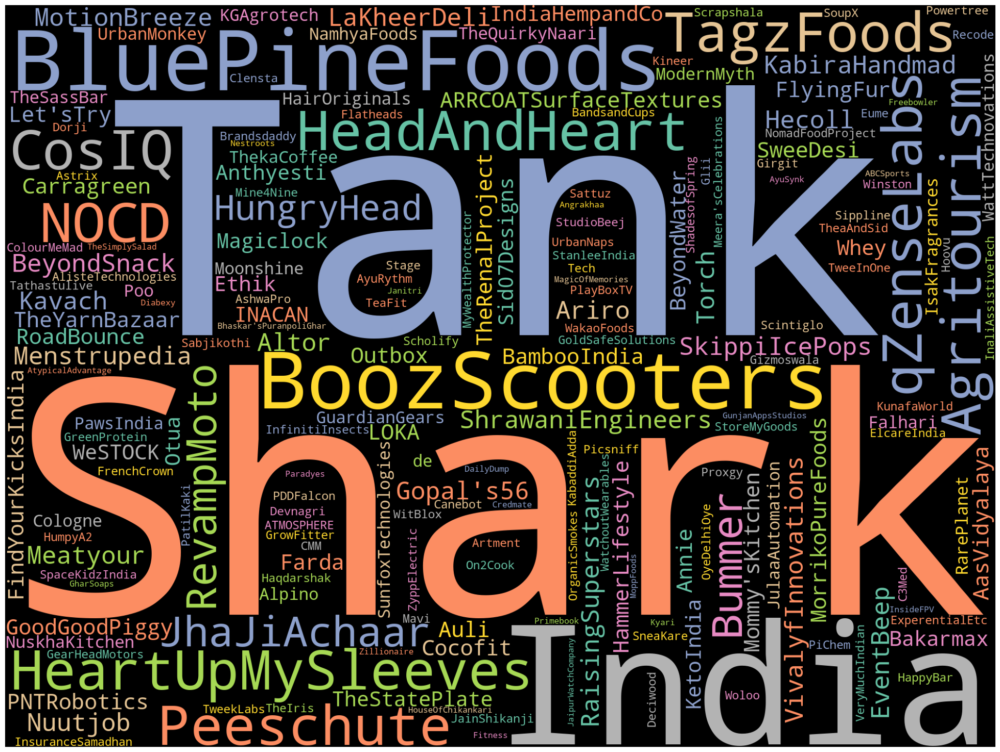

In [45]:
# Word cloud based on Startup Names, in all seasons
text = " Shark Tank India ".join(cat for cat in shark_tank['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='black', colormap='Set2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

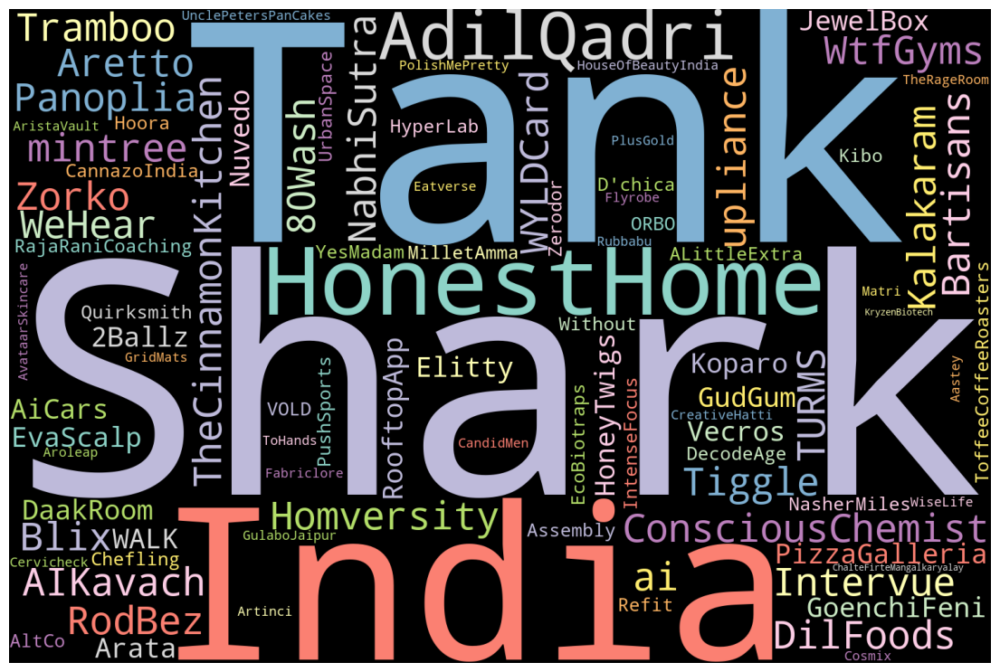

In [46]:
# Word cloud based on Startup Names, in current/latest season (3rd season)
text = " Shark Tank India ".join(cat for cat in shark_tank_season3['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=1500, height=1000, stopwords=stop_words, background_color='black', colormap='Set3', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(14,14))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 🔥 Ashneer Grover's Investments

Total investments by Ashneer 21
Investment amount by Ashneer 5.39 crores
Equity received by Ashneer 93.24 % in different companies
Debt/loan amount by Ashneer 1.14 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Ashneer Investment Amount
     BluePineFoods                         Food                      25.00
      BoozScooters Vehicles/Electrical Vehicles                      20.00
         TagzFoods                         Food                      70.00
     SkippiIcePops                         Food                      20.00
 RaisingSuperstars                    Education                      50.00
       BeyondSnack                         Food                      25.00
      MotionBreeze Vehicles/Electrical Vehicles                      30.00
         EventBeep                    Education                      10.00
     TheYarnBazaar                Manufacturing             

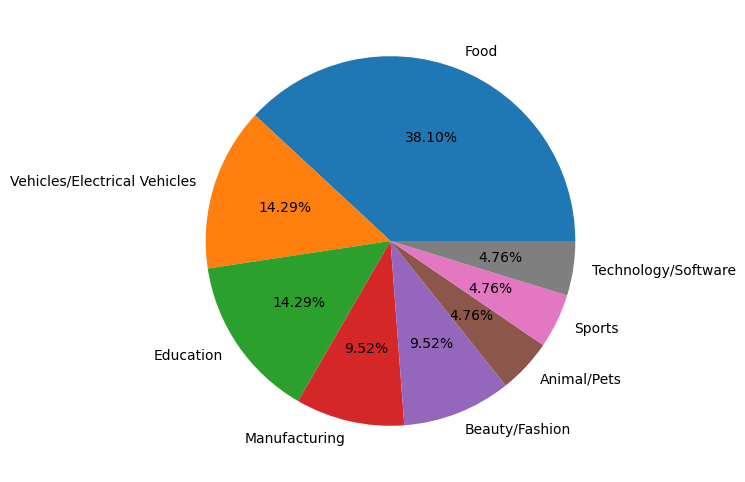

In [47]:
print("Total investments by Ashneer", shark_tank[shark_tank['Ashneer Investment Amount']>=0][['Ashneer Investment Amount']].count().to_string()[-2:])
print("Investment amount by Ashneer", round(shark_tank['Ashneer Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Ashneer", round(shark_tank['Ashneer Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Ashneer", round(shark_tank['Ashneer Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Ashneer Investment Amount']>=0][["Startup Name","Industry","Ashneer Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAshneer industry wise investments\n")
print(shark_tank[shark_tank['Ashneer Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Ashneer Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Ashneer Investment Amount']>=0] [["Startup Name","Ashneer Investment Amount","Ashneer Investment Equity"]].sort_values(by="Ashneer Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Ashneer Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 Namita Thapar's Investments

Total investments by Namita 77
Investment amount by Namita 25.43 crores
Equity received by Namita 320.16 % in different companies
Debt/loan amount by Namita 5.25 crores

Company details:
---------------------------------------------------------------------------
       Startup Name             Industry  Namita Investment Amount
        JhaJiAchaar                 Food                 28.300000
             Bummer       Beauty/Fashion                 37.500000
      SkippiIcePops                 Food                 20.000000
       Menstrupedia            Education                 50.000000
              Altor        Manufacturing                 25.000000
            Nuutjob       Beauty/Fashion                  8.330000
              Farda       Beauty/Fashion                 15.000000
               Auli       Beauty/Fashion                 75.000000
              Annie            Education                 35.000000
    TheRenalProject       Medical/Health                 50.000000


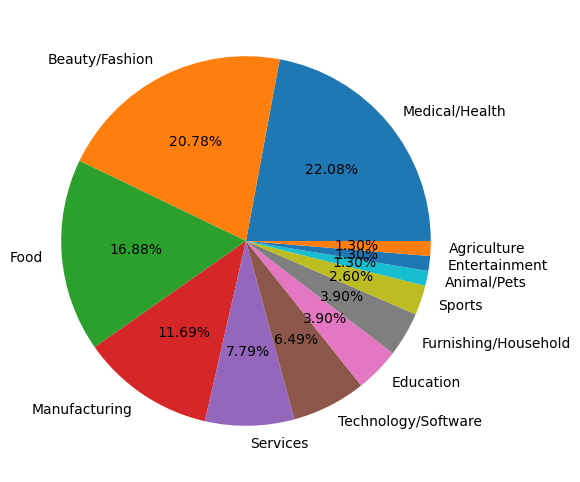

In [48]:
print("Total investments by Namita", shark_tank[shark_tank['Namita Investment Amount']>0][['Namita Investment Amount']].count().to_string()[-2:])
print("Investment amount by Namita", round(shark_tank['Namita Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Namita", round(shark_tank['Namita Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Namita", round(shark_tank['Namita Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Namita Investment Amount']>0][["Startup Name","Industry","Namita Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nNamita industry wise investments\n")
print(shark_tank[shark_tank['Namita Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Namita Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Namita Investment Amount']>0] [["Startup Name","Namita Investment Amount","Namita Investment Equity"]].sort_values(by="Namita Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Namita Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ㊂ Anupam Mittal's Investments

Total investments by Anupam 65
Investment amount by Anupam 19.85 crores
Equity received by Anupam 325.11 % in different companies
Debt/loan amount by Anupam 1.4 crores

Company details:
-------------------------------------------------------------------------------------
          Startup Name                     Industry  Anupam Investment Amount
      HeartUpMySleeves               Beauty/Fashion                 12.500000
                 CosIQ               Beauty/Fashion                 25.000000
            RevampMoto Vehicles/Electrical Vehicles                 50.000000
         SkippiIcePops                         Food                 20.000000
                Kavach                    Education                  2.500000
    VivalyfInnovations               Medical/Health                 28.000000
              Meatyour                         Food                 10.000000
ARRCOATSurfaceTextures                Manufacturing                 50.000000
                  LOKA    

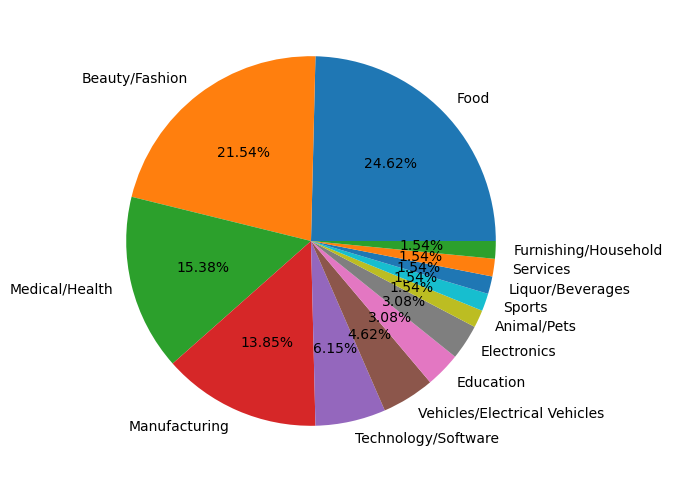

In [49]:
print("Total investments by Anupam", shark_tank[shark_tank['Anupam Investment Amount']>=0][['Anupam Investment Amount']].count().to_string()[-2:])
print("Investment amount by Anupam", round(shark_tank['Anupam Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Anupam", round(shark_tank['Anupam Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Anupam", round(shark_tank['Anupam Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*85)
print(shark_tank.loc[shark_tank['Anupam Investment Amount']>=0][["Startup Name","Industry","Anupam Investment Amount"]].to_string(index=False))
print('-'*85)

print("\nAnupam industry wise investments\n")
print(shark_tank[shark_tank['Anupam Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Anupam Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Anupam Investment Amount']>=0] [["Startup Name","Anupam Investment Amount","Anupam Investment Equity"]].sort_values(by="Anupam Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Anupam Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎇 Vineeta Singh's Investments
#### Vineeta's portfolio has 40% Food industry and 23% Beauty/Fashion industry

Total investments by Vineeta 60
Investment amount by Vineeta 19.5 crores
Equity received by Vineeta 268.71 % in different companies
Debt/loan amount by Vineeta 2.44 crores

Company details:
---------------------------------------------------------------------------
       Startup Name                     Industry  Vineeta Investment Amount
      BluePineFoods                         Food                      25.00
       BoozScooters Vehicles/Electrical Vehicles                      20.00
   HeartUpMySleeves               Beauty/Fashion                      12.50
               NOCD                         Food                      20.00
              CosIQ               Beauty/Fashion                      25.00
        JhaJiAchaar                         Food                      28.30
      SkippiIcePops                         Food                      20.00
         Get-A-Whey                         Food                      33.33
     TheQuirkyNaari               Beauty/Fashion  

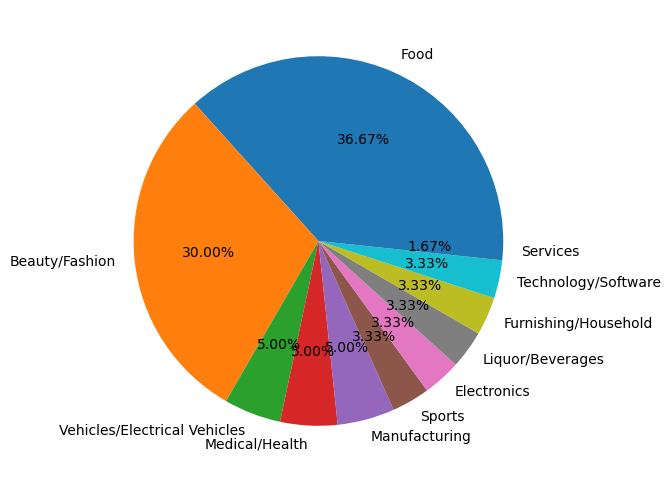

In [50]:
print("Total investments by Vineeta", shark_tank[shark_tank['Vineeta Investment Amount']>0][['Vineeta Investment Amount']].count().to_string()[-2:])
print("Investment amount by Vineeta", round(shark_tank['Vineeta Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Vineeta", round(shark_tank['Vineeta Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Vineeta", round(shark_tank['Vineeta Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Vineeta Investment Amount']>0][["Startup Name","Industry","Vineeta Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nVineeta industry wise investments\n")
print(shark_tank[shark_tank['Vineeta Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Vineeta Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Vineeta Investment Amount']>0] [["Startup Name","Vineeta Investment Amount","Vineeta Investment Equity"]].sort_values(by="Vineeta Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Vineeta Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🚀 Aman Gupta's Investments

Total investments by Aman 92
Investment amount by Aman 32.35 crores
Equity received by Aman 299.18 % in different companies
Debt/loan amount by Aman 4.49 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Aman Investment Amount
     BluePineFoods                         Food               25.000000
         Peeschute               Beauty/Fashion               75.000000
            Bummer               Beauty/Fashion               37.500000
        RevampMoto Vehicles/Electrical Vehicles               50.000000
     SkippiIcePops                         Food               20.000000
 RaisingSuperstars                    Education               50.000000
            Kavach                    Education                2.500000
       BeyondSnack                         Food               25.000000
             Altor                Manufacturing               25.000000
             Ariro       

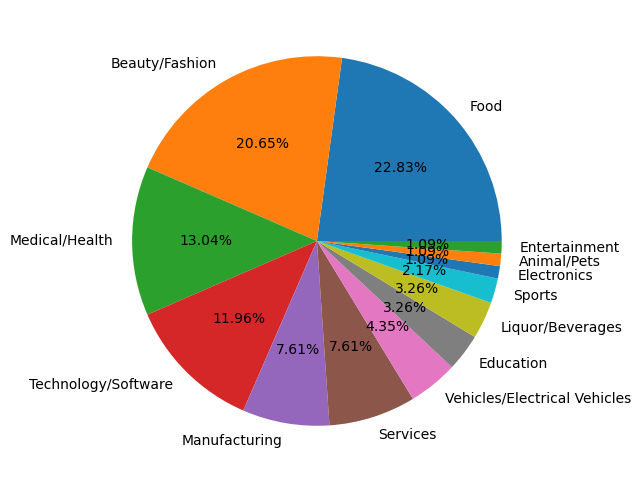

In [51]:
print("Total investments by Aman", shark_tank[shark_tank['Aman Investment Amount']>=0][['Aman Investment Amount']].count().to_string()[-2:])
print("Investment amount by Aman", round(shark_tank['Aman Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Aman", round(shark_tank['Aman Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Aman", round(shark_tank['Aman Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Aman Investment Amount']>=0][["Startup Name","Industry","Aman Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAman industry wise investments\n")
print(shark_tank[shark_tank['Aman Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Aman Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Aman Investment Amount']>=0] [["Startup Name","Aman Investment Amount","Aman Investment Equity"]].sort_values(by="Aman Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Aman Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎾 Peyush Bansal's Investments

Total investments by Peyush 86
Investment amount by Peyush 30.1 crores
Equity received by Peyush 494.23 % in different companies
Debt/loan amount by Peyush 3.42 crores

Company details:
---------------------------------------------------------------------------
      Startup Name                     Industry  Peyush Investment Amount
VivalyfInnovations               Medical/Health                 28.000000
             Ariro                Manufacturing                 25.000000
           Nuutjob               Beauty/Fashion                  8.330000
          Meatyour                         Food                 10.000000
         EventBeep                    Education                 10.000000
              LOKA          Technology/Software                 13.330000
             Annie                    Education                 35.000000
        Carragreen                Manufacturing                 25.000000
     TheYarnBazaar                Manufacturing                 25.00000

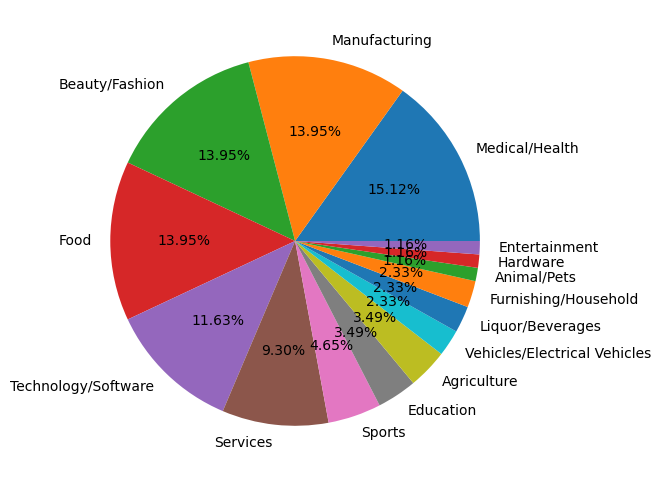

In [52]:
print("Total investments by Peyush", shark_tank[shark_tank['Peyush Investment Amount']>=0][['Peyush Investment Amount']].count().to_string()[-2:])
print("Investment amount by Peyush", round(shark_tank['Peyush Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Peyush", round(shark_tank['Peyush Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Peyush", round(shark_tank['Peyush Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Peyush Investment Amount']>=0][["Startup Name","Industry","Peyush Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nPeyush industry wise investments\n")
print(shark_tank[shark_tank['Peyush Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Peyush Investment Amount']>=0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Peyush Investment Amount']>=0] [["Startup Name","Peyush Investment Amount","Peyush Investment Equity"]].sort_values(by="Peyush Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Peyush Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ✳️ Amit Jain's Investments

Total investments by Amit 27
Investment amount by Amit 10.58 crores
Equity received by Amit 130.08 % in different companies
Debt/loan amount by Amit 1.45 crores

Company details:
---------------------------------------------------------------------------
 Startup Name                     Industry  Amit Investment Amount
    InsideFPV                Manufacturing                   18.75
    Angrakhaa               Beauty/Fashion                   40.00
    MoppFoods                         Food                   75.00
       Dobiee                         Food                   72.00
        Pflow               Medical/Health                   30.00
       ekatra         Furnishing/Household                   10.00
    licksters                         Food                   25.00
   ScrapUncle                     Services                   60.00
       UnStop          Technology/Software                   50.00
  Cakelicious                         Food                   25.00
     Hor

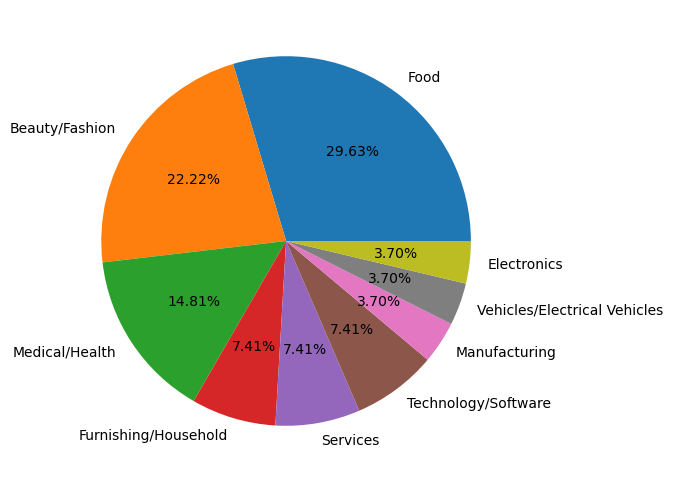

In [53]:
print("Total investments by Amit", shark_tank[shark_tank['Amit Investment Amount']>=0][['Amit Investment Amount']].count().to_string()[-2:])
print("Investment amount by Amit", round(shark_tank['Amit Investment Amount'].sum()/100, 2), "crores")
print("Equity received by Amit", round(shark_tank['Amit Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by Amit", round(shark_tank['Amit Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Amit Investment Amount']>0][["Startup Name","Industry","Amit Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAmit industry wise investments\n")
print(shark_tank[shark_tank['Amit Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Amit Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Amit Investment Amount']>0] [["Startup Name","Amit Investment Amount","Amit Investment Equity"]].sort_values(by="Amit Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Amit Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 All Guest's Investments

Total investments by all Guests 31
Investment amount by all Guests 12.96 crores
Equity received by all Guests 110.16 % in different companies
Debt/loan amount by all Guests 0.87 crores

Company details:
---------------------------------------------------------------------------
        Startup Name                     Industry  Guest Investment Amount
          TheSassBar               Beauty/Fashion                25.000000
  SunfoxTechnologies               Medical/Health                20.000000
   WattTechnovations               Medical/Health                 0.000253
             HumpyA2                         Food                33.330000
   GoldSafeSolutions                Manufacturing                16.660000
          WakaoFoods                         Food                25.000000
    NomadFoodProject                         Food                10.000000
             WitBlox                Manufacturing                30.000000
                 TAC               Beauty/Fash

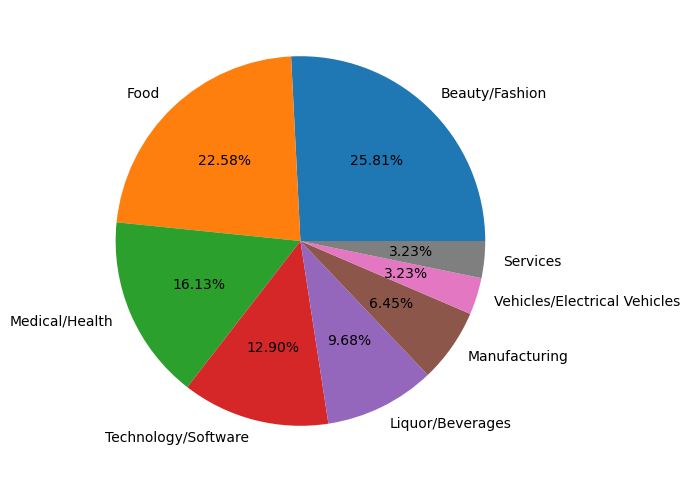

In [54]:
print("Total investments by all Guests", shark_tank[shark_tank['Guest Investment Amount']>=0][['Guest Investment Amount']].count().to_string()[-2:])
print("Investment amount by all Guests", round(shark_tank['Guest Investment Amount'].sum()/100, 2), "crores")
print("Equity received by all Guests", round(shark_tank['Guest Investment Equity'].sum(), 2), "% in different companies")
print("Debt/loan amount by all Guests", round(shark_tank['Guest Debt Amount'].sum()/100, 2), "crores\n")

print("Company details:")
print('-'*75)
print(shark_tank.loc[shark_tank['Guest Investment Amount']>0][["Startup Name","Industry","Guest Investment Amount"]].to_string(index=False))
print('-'*75)

print("\nAll Guests industry wise investments\n")
print(shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (10,6))
shark_tank[shark_tank['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount']>0] [["Startup Name","Guest Investment Amount","Guest Investment Equity"]].sort_values(by="Guest Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Guest Investment Amount'], width=800, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

In [55]:
# Guest sharks and number of companies they invested
shark_tank.loc[shark_tank['Guest Investment Amount'] > 1]['Invested Guest Name'].str.split(',').explode('Guest Name').value_counts().sort_values(ascending=False)

Invested Guest Name
Ritesh Aggarwal     12
Ghazal               7
Azhar Iqubal         4
Radhika Gupta        3
Vikas                2
Ronnie Screwvala     2
Varun Dua            2
Deepinder Goyal      1
Name: count, dtype: int64

In [56]:
# Investment amount by guests, in lakhs
round(shark_tank.groupby(["Invested Guest Name"])["Guest Investment Amount"].sum().sort_values(ascending=False))

Invested Guest Name
Ritesh Aggarwal                  304.0
Azhar Iqubal                     200.0
Deepinder Goyal                  200.0
Ritesh Aggarwal,Radhika Gupta    180.0
Ghazal                           160.0
Ronnie Screwvala                  68.0
Vikas                             66.0
Varun Dua                         60.0
Varun Dua,Radhika Gupta           60.0
Name: Guest Investment Amount, dtype: float64

In [57]:
tmpdf = shark_tank.loc[shark_tank['Guest Investment Amount'] > 1]
tmpdf[['Invested Guest Name','Guest Investment Amount']]

,Invested Guest Name,Guest Investment Amount
76,Ghazal,25.00
80,Ghazal,20.00
89,Ghazal,33.33
91,Ghazal,16.66
92,Ghazal,25.00
111,Ghazal,10.00
122,Ghazal,30.00
317,Vikas,40.50
318,Vikas,25.00
327,Ritesh Aggarwal,10.00


Number of Sharks in Deal
1.0    97
2.0    72
3.0    33
4.0    18
5.0    10
Name: count, dtype: int64 

Number of Sharks in Deal
1.0    42%
2.0    31%
3.0    14%
4.0     8%
5.0     4%
Name: proportion, dtype: object


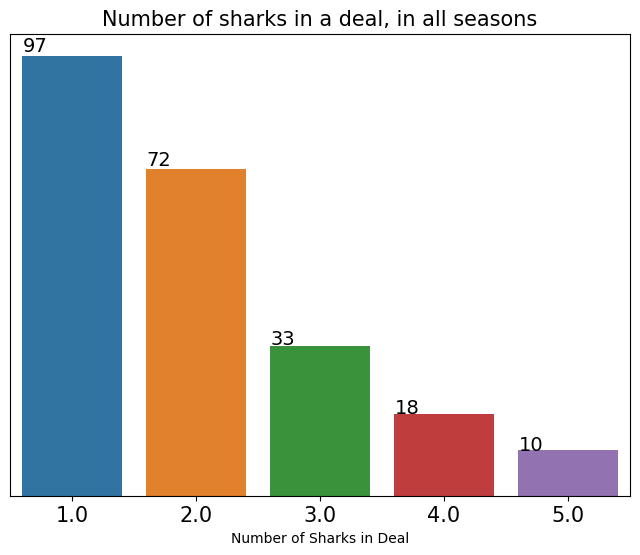

In [58]:
# Number of sharks in a deal, in all seasons
print(shark_tank['Number of Sharks in Deal'].value_counts(), "\n")

# In percentage
print(round(shark_tank['Number of Sharks in Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

fig = plt.figure(figsize=(8, 6))
plt.title("Number of sharks in a deal, in all seasons", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks([])
ax = sns.countplot(data = shark_tank, x = 'Number of Sharks in Deal')
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01), size=14)

In [59]:
# All sharks deals
print(shark_tank.loc[shark_tank['Number of Sharks in Deal'] >= 5][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]])

     Season Number        Startup Name  Total Deal Amount  Total Deal Equity
15               1       SkippiIcePops              100.0               15.0
50               1  FindYourKicksIndia               50.0               25.0
64               1              INACAN              100.0               10.0
80               1  SunfoxTechnologies              100.0                6.0
209              2              Snitch              150.0                1.5
239              2            Mahantam               30.0               20.0
274              2         Pharmallama              200.0                5.0
311              2           Sahayatha              100.0               10.0
357              3            JewelBox              200.0                6.0
365              3         NasherMiles              300.0                1.5


In [60]:
# Sharks with most number of solo deals
amt_cols = shark_tank.columns[shark_tank.columns.str.contains(' Investment Amount')].tolist()
tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 1][amt_cols]
tmp.count().sort_values(ascending=False).nlargest(3)

# Namita did most number of solo deals, than any other Shark

Namita Investment Amount    22
Aman Investment Amount      18
Peyush Investment Amount    17
dtype: int64

In [61]:
# Sharks with most number of episode presence, in all seasons
present_cols = shark_tank.columns[shark_tank.columns.str.endswith(' Present')].tolist()
tmp = shark_tank[present_cols]
tmp.sum().sort_values(ascending=False).nlargest(3)

# Anupam was there in most number of episodes

Anupam Present    363.0
Aman Present      353.0
Namita Present    340.0
dtype: float64

In [62]:
# Sharks with most number of episode presence, in current/latest season (3rd Season)
tmp = shark_tank.loc[shark_tank['Season Number'] == 3][present_cols]
tmp.sum().sort_values(ascending=False).nlargest(4)

Anupam Present     81.0
Aman Present       81.0
Vineeta Present    75.0
Guest Present      75.0
dtype: float64

In [63]:
# Anchor and number of pitches, they hosted
shark_tank.groupby('Anchor').size()

Anchor
Rahul Dua          259
Rannvijay Singh    152
dtype: int64

In [64]:
# Anchor and number of episodes, they hosted
pd.pivot_table(shark_tank, values='Episode Number', columns='Anchor', aggfunc='max')

Anchor,Rahul Dua,Rannvijay Singh
Episode Number,51,36


In [65]:
# Sharks
# tmp = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols].stack()
# tmp
# tmp2 = shark_tank.loc[shark_tank['Number of Sharks in Deal'] == 2][amt_cols].transpose()
# tmp2

Pitchers State
Maharashtra          118
Delhi                 60
Karnataka             49
Gujarat               45
Haryana               28
Uttar Pradesh         22
West Bengal           19
Telangana             16
Rajasthan             15
Punjab                12
Madhya Pradesh         8
Tamil Nadu             8
Bihar                  5
Jammu & Kashmir        4
Goa                    4
Kerala                 3
Jharkhand              3
Uttarakhand            2
Chhattisgarh           2
Himachal Pradesh       1
Andhra Pradesh         1
Arunachal Pradesh      1
Assam                  1
Tamilnadu              1
Name: count, dtype: int64 



<Axes: ylabel='Pitchers State'>

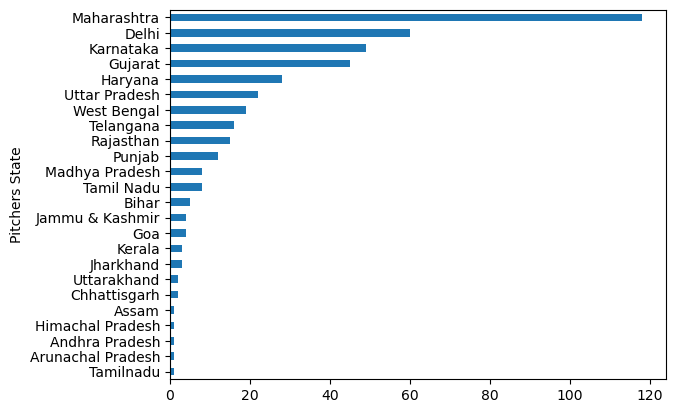

In [66]:
print(shark_tank['Pitchers State'].str.split(',').explode('Pitchers State').value_counts(), "\n")
shark_tank['Pitchers State'].str.split(',').explode('Pitchers State').value_counts().sort_values().plot.barh()

In [67]:
# Top 20 Indian Cities
tmp = shark_tank['Pitchers City'].value_counts().nlargest(20).sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b>Indian top 20 cities</b> with number of startups came for pitching", template='simple_white', text=tmp, width=850, height=800)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [68]:
# Most frequently asked amount, by startups
shark_tank.groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (in lakhs) and Number times asked

Original Ask Amount
50.0     90
100.0    71
75.0     50
60.0     25
40.0     22
80.0     20
150.0    20
30.0     17
90.0     10
200.0    10
dtype: int64

In [69]:
# Most frequently offered equity, by startups
shark_tank.groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered

Original Offered Equity
1.0     84
2.0     64
5.0     62
10.0    38
3.0     32
4.0     24
2.5     22
0.5     17
1.5     13
7.5     11
dtype: int64

In [70]:
# ✅ Most frequently invested amount, by Sharks
shark_tank.groupby('Total Deal Amount').size().nlargest(10)

# Total Deal Amount (in lakhs) and Number times invested
# Sharks mostly invested between 50K-1lakh per deal

Total Deal Amount
50.0     45
100.0    37
75.0     22
60.0     18
40.0     13
30.0     12
25.0     10
80.0      9
20.0      8
150.0     7
dtype: int64

In [71]:
# ✅ Most frequently received total equity, by Sharks
shark_tank.groupby('Total Deal Equity').size().nlargest(10)

# Total Deal Equity (in %) and Number times invested
# Sharks are expecting around 10-20% equity, in a deal

Total Deal Equity
10.0    27
1.0     20
5.0     20
4.0     17
20.0    16
2.0     15
3.0     15
15.0    14
6.0     11
1.5      7
dtype: int64

In [72]:
# ✅ Mostly successful combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Received Offer'] == 1].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

Original Ask Amount  Original Offered Equity
50.0                 5.0                        15
100.0                1.0                        13
50.0                 2.0                         9
100.0                2.0                         9
60.0                 2.0                         8
50.0                 1.0                         7
75.0                 4.0                         7
50.0                 3.0                         6
                     10.0                        6
70.0                 1.0                         6
dtype: int64

In [73]:
# Most frequently asked amount, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (in lakhs) and Number times asked (but rejected by sharks) ❌

Original Ask Amount
50.0     29
100.0    22
75.0     15
60.0      8
80.0      7
40.0      6
200.0     6
90.0      5
20.0      4
25.0      4
dtype: int64

In [74]:
# Most frequently offered equity, by startups who could NOT get a deal
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered (but rejected by sharks) ❌

Original Offered Equity
5.0     25
1.0     23
2.0     17
10.0    14
3.0     10
2.5      9
1.5      4
4.0      4
7.5      4
15.0     4
dtype: int64

In [75]:
# Mostly rejected combinations (of asked amount and offered equity)
shark_tank.loc[shark_tank['Received Offer'] == 0].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(5)

# You may not get deal, if you ask for 1 crore with 1% equity or 50K with 5%/10% equity 🔴

Original Ask Amount  Original Offered Equity
100.0                1.0                        9
50.0                 5.0                        7
                     10.0                       5
75.0                 5.0                        5
60.0                 2.0                        4
dtype: int64

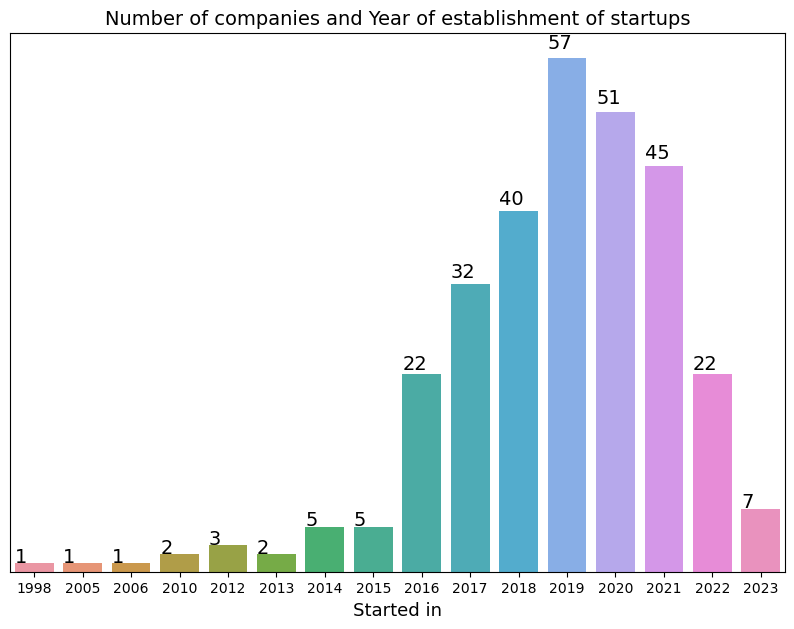

In [76]:
# All season's, startup companies incorporated year
fig = plt.figure(figsize=(10, 7))
plt.title('Number of companies and Year of establishment of startups', size=14)
tmp = shark_tank.loc[shark_tank['Started in'].notnull()]
ax = sns.countplot(data = tmp, x = 'Started in')
ax.set_xlabel('Started in', fontsize=13)
plt.yticks([])
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02), size=14)

In [77]:
# Some companies got more amount than they asked/expected
print(shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Original Ask Amount'] < shark_tank["Total Deal Amount"]][["Season Number","Startup Name","Original Ask Amount","Total Deal Amount"]]

Startup Name    35
dtype: int64


,Season Number,Startup Name,Original Ask Amount,Total Deal Amount
0,1,BluePineFoods,50.0,75.0
10,1,JhaJiAchaar,50.0,56.6
15,1,SkippiIcePops,45.0,100.0
37,1,Annie,30.0,105.0
39,1,TheYarnBazaar,50.0,100.0
43,1,HammerLifestyle,30.0,100.0
59,1,WeSTOCK,50.0,60.0
64,1,INACAN,50.0,100.0
76,1,TheSassBar,40.0,50.0
89,1,HumpyA2,75.0,100.0


In [78]:
# Most of the companies diluted/gave their company equity more than they initially offered/expected
shark_tank.loc[shark_tank['Original Offered Equity'] < shark_tank["Total Deal Equity"]][["Season Number","Startup Name","Original Offered Equity","Total Deal Equity"]]

,Season Number,Startup Name,Original Offered Equity,Total Deal Equity
0,1,BluePineFoods,5.0,16.00
1,1,BoozScooters,15.0,50.00
2,1,HeartUpMySleeves,10.0,30.00
3,1,TagzFoods,1.0,2.75
7,1,Peeschute,4.0,6.00
...,...,...,...,...
403,3,CandidMen,2.0,5.00
404,3,Flyrobe,1.0,4.00
405,3,WiseLife,2.0,4.00
406,3,Cervicheck,1.5,5.00


In [79]:
# Below (19) companies got the same valuation they requested (with or without loan)
print(shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Startup Name"]].count())
shark_tank.loc[shark_tank['Valuation Requested'] == shark_tank["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    24
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
20,1,Kavach,50.0,50.0
22,1,BeyondSnack,2000.0,2000.0
45,1,Cocofit,0.0,0.0
86,1,WattTechnovations,0.0,0.0
171,2,TheSimplySalad,300.0,300.0
185,2,Janitri,4000.0,4000.0
203,2,NeoMotion,10000.0,10000.0
219,2,PadCare,2500.0,2500.0
223,2,Geeani,1000.0,1000.0
240,2,MindPeers,5300.0,5300.0


In [80]:
# There is 1 company which got more valuation than they pitched, JhaJi Achaar received after the Season (in 2023)
shark_tank.loc[shark_tank['Valuation Requested'] < shark_tank["Deal Valuation"]][["Startup Name","Valuation Requested","Deal Valuation"]]

,Startup Name,Valuation Requested,Deal Valuation
10,JhaJiAchaar,500.0,1007.0
372,HyperLab,1000.0,2500.0


In [81]:
# Some companies were on pre-revenue or didn't had any revenue (as of pitching day)
shark_tank.loc[shark_tank['Yearly Revenue'] == 0]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
9,1,CosIQ,4,10,20-Dec-21,4-Feb-22,NaN,Entrepreneurship Ki Wave,Rannvijay Singh,Beauty/Fashion,Intelligent Skincare,https://mycosiq.com/,2021,2,1,1,<NA>,1,Middle,Delhi,Delhi,0,4.0,75,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
23,1,VivalyfInnovations,8,24,20-Dec-21,4-Feb-22,NaN,Shark Ko Impress Karne Wale Ideas,Rannvijay Singh,Medical/Health,Easy Life Prickless Diabetes Testing Machine,https://vivalyf.in/,2021,2,1,1,<NA>,0,Young,Hyderabad,Telangana,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,28.0,16.66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
24,1,MotionBreeze,8,25,20-Dec-21,4-Feb-22,NaN,Shark Ko Impress Karne Wale Ideas,Rannvijay Singh,Vehicles/Electrical Vehicles,Smart Electric Motorcycle,https://www.motionautomotive.in/,2018,4,4,<NA>,<NA>,0,Middle,Vadodara,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
42,1,GoodGoodPiggy,14,43,20-Dec-21,4-Feb-22,NaN,Naye Aur Nayab Pitchers,Rannvijay Singh,Technology/Software,Digital Piggy Bank,https://goodgoodpiggy.com/,2021,2,<NA>,2,<NA>,0,Young,Delhi,Delhi,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
77,1,KGAgrotech,24,78,20-Dec-21,4-Feb-22,NaN,A Decade Of Indian Entrepreneurship,Rannvijay Singh,Agriculture,Agricultural Innovations,https://www.instagram.com/jugaadu_kamlesh/,2022,2,2,<NA>,<NA>,0,Young,Malegaon,Maharashtra,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,10.0,40.00,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
83,1,JulaaAutomation,26,84,20-Dec-21,4-Feb-22,NaN,Revolutionary Ideas,Rannvijay Singh,Manufacturing,Automatic Cradle,https://www.automaticjulaa.com/,2022,3,3,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
98,1,Scholify,30,99,20-Dec-21,4-Feb-22,NaN,Sharks Ki Expertise,Rannvijay Singh,Education,Scholarship Platform,https://scholifyme.com/,2018,1,1,<NA>,<NA>,0,Middle,Bangalore,Karnataka,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
100,1,Sabjikothi,31,101,20-Dec-21,4-Feb-22,NaN,Entrepreneurship Ki Raah,Rannvijay Singh,Manufacturing,Vegetables Storage SaptKrishi,https://www.saptkrishi.com/,2019,2,1,1,<NA>,0,Young,Bhagalpur,Bihar,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN,1.0,NaN
114,1,On2Cook,34,115,20-Dec-21,4-Feb-22,NaN,Scaling Ambitions,Rannvijay Singh,Food,Fastest Cooking Device,https://on2cook.com/,2022,1,1,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0
131,1,Scintiglo,0,132,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Medical/Health,Diagnostic device for microalbuminuria estimation,https://cemd.in/,2021,1,1,<NA>,<NA>,0,Middle,Indore,Madhya Pradesh,0,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [82]:
# Some companies were on burning/paying money from their pocket, without any profit (as of pitching day)
shark_tank.loc[shark_tank['Cash Burn'] == 'yes']

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Episode Title,Anchor,Industry,Business Description,Company Website,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Pitchers Average Age,Pitchers City,Pitchers State,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,...,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Invested Guest Name,All Guest Names,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
62,1,TheStatePlate,20,63,20-Dec-21,4-Feb-22,NaN,A Variety Of Ideas,Rannvijay Singh,Food,Delicacies,https://thestateplate.com/,2020,2,1,1,<NA>,0,Young,"Bangalore,Kolkata","Karnataka,West Bengal",<NA>,40.0,34,<NA>,...,NaN,NaN,NaN,40.00,3.000,25.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
81,1,Alpino,25,82,20-Dec-21,4-Feb-22,NaN,An Ocean Of Opportunities,Rannvijay Singh,Food,Roasted Peanut butter Products,https://alpino.store/,2016,4,4,<NA>,<NA>,0,Young,Surat,Gujarat,<NA>,NaN,38,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ghazal,1.0,1.0,1.0,NaN,1.0,NaN,NaN,1.0
105,1,GrowFitter,32,106,20-Dec-21,4-Feb-22,NaN,The Road To Success,Rannvijay Singh,Technology/Software,Rewards App,https://www.growfitter.com/,2021,2,2,<NA>,<NA>,0,Middle,Mumbai,Maharashtra,170,NaN,<NA>,<NA>,...,50.00,2.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN,1.0,NaN
137,1,ZyppElectric,0,138,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Vehicles/Electrical Vehicles,Electrical Vehicles,https://zypp.app/,2017,2,1,1,<NA>,1,Young,Gurgaon,Haryana,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
140,1,HappyBar,0,141,20-Dec-21,4-Feb-22,NaN,Unseen,Rannvijay Singh,Food,FitSport delicious snacks,https://www.fitsport.me/,2019,3,2,1,<NA>,0,Middle,Hyderabad,Telangana,<NA>,29.0,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
157,2,SoupX,2,158,2-Jan-23,10-Mar-23,NaN,A Bigger Vision,Rahul Dua,Food,Soup based meals,https://www.soupx.in/,<NA>,2,2,<NA>,<NA>,0,Young,Delhi,Delhi,<NA>,NaN,45,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN
165,2,Flatheads,5,166,2-Jan-23,10-Mar-23,NaN,Investing in the Future of India,Rahul Dua,Beauty/Fashion,Shoes Sneakers Loafers,https://www.flatheads.in/,2019,1,1,<NA>,<NA>,0,Middle,Bangalore,Karnataka,<NA>,NaN,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN
194,2,FastBeetle,15,195,2-Jan-23,10-Mar-23,NaN,Changing The Face Of Indian Entrepreneurship,Rahul Dua,Services,Local courier and parcel service,https://www.fastbeetle.com/,2019,2,2,<NA>,<NA>,0,Young,Srinagar,Jammu & Kashmir,<NA>,25.0,54,<NA>,...,45.00,3.7500,NaN,45.00,3.750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,NaN,NaN
196,2,VSMani,16,197,2-Jan-23,10-Mar-23,NaN,Pitchers Ki Taiyyari,Rahul Dua,Food,Coffee and snacks,https://vsmani.com/,2020,3,3,<NA>,<NA>,0,Middle,Bangalore,Karnataka,<NA>,63.0,<NA>,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,NaN,NaN
208,2,Bullspree,19,209,2-Jan-23,10-Mar-23,NaN,Building Brands For India,Rahul Dua,Technology/Software,App to learn stock market basics,https://bullspree.com/,<NA>,3,3,<NA>,<NA>,0,Middle,Ahmedabad,Gujarat,<NA>,NaN,<NA>,<NA>,...,37.50,1.4300,NaN,37.50,1.430,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,NaN,NaN,NaN


In [83]:
# Top 15 Highest Yearly Revenue brands, in all seasons
print(shark_tank.groupby('Startup Name')['Yearly Revenue'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Yearly Revenue', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Yearly Revenue', color="Startup Name", template='simple_white', title="<b>Highest revenue (in lakhs) of participated startups, in all seasons</b>", text=tmpdf['Yearly Revenue'])
fig.show()

Startup Name
Refit                  18700
FrenchCrown             7200
NasherMiles             5700
Rubans                  5100
YesMadam                5000
Toyshine                4500
Zorko                   3000
UrbanMonkey             2500
GunjanAppsStudios       2400
AdilQadri               2070
UrbanSpace              2050
UnStop                  1600
HonestHome              1400
StyloBug                1400
UnclePetersPanCakes     1400
Name: Yearly Revenue, dtype: Int32


In [84]:
# Top 10 Highest Yearly Revenue brands, in latest/current season (3rd season)
print(shark_tank_season3.groupby('Startup Name')['Yearly Revenue'].max().nlargest(10))

tmpdf = shark_tank_season3.sort_values('Yearly Revenue', ascending=False)[0:10]
fig = px.bar(tmpdf, x="Startup Name", y='Yearly Revenue', color="Startup Name", template='simple_white', title="<b>Highest revenue (in lakhs) of participated startups, in Season 3</b>", text=tmpdf['Yearly Revenue'])
fig.show()

Startup Name
Refit                  18700
NasherMiles             5700
YesMadam                5000
Zorko                   3000
AdilQadri               2070
UrbanSpace              2050
HonestHome              1400
UnclePetersPanCakes     1400
Assembly                1150
DecodeAge               1100
Name: Yearly Revenue, dtype: Int32


In [85]:
# Top 15 highest Gross Margin brands, in all seasons
print(shark_tank.groupby('Startup Name')['Gross Margin'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Gross Margin', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Gross Margin', color="Startup Name", template='simple_white', title="<b>Highest Gross margin (in %) of the brands (in all seasons)</b>", text=tmpdf['Gross Margin'].map(int).map(str) + "%")
fig.show()

Startup Name
Poo-de-Cologne        150
Farda                 115
Cocofit                95
UnStop                 90
AvataarSkincare        87
EvaScalp               85
MidNightAngelsByPC     83
Auli                   80
KabaddiAdda            80
LeafyAffair            80
Pflow                  80
ekatra                 80
oyehappy               80
CosIQ                  75
Dabble                 75
Name: Gross Margin, dtype: Int32


In [86]:
# Top 15 highest Net Margin brands, in all seasons
print(shark_tank.groupby('Startup Name')['Net Margin'].max().nlargest(15))

tmpdf = shark_tank.sort_values('Net Margin', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Net Margin', color="Startup Name", template='simple_white', title="<b>Highest Net margin (in %) of the brands</b>", text=tmpdf['Net Margin'].map(int).map(str) + "%")
fig.show()

Startup Name
TheSassBar            55
Chefling              45
AlisteTechnologies    40
Cakelicious           40
TwistingScoops        40
SharmaJiKiAata        38
DrCubes               35
Pabiben               35
VAPerfume             35
NamhyaFoods           34
KabaddiAdda           30
Kibo                  30
KunafaWorld           30
NishHair              30
TheaAndSid            30
Name: Net Margin, dtype: Int32


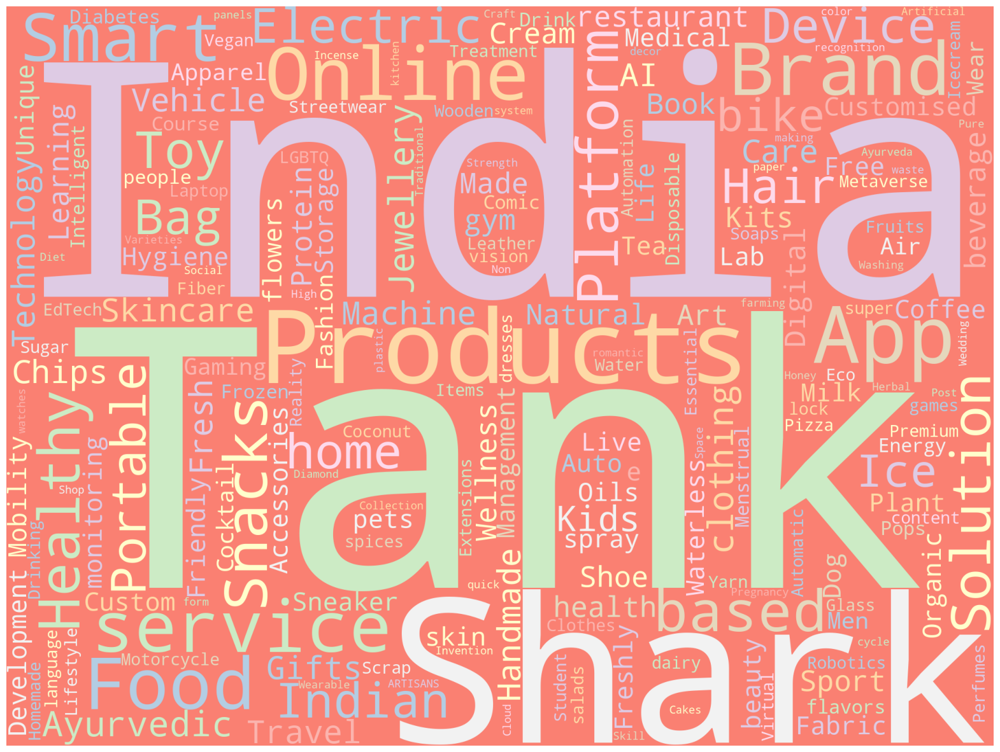

In [87]:
# Word cloud based on Business Description of startups came in all seasons
text = " Shark Tank India ".join(cat for cat in shark_tank.loc[shark_tank['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel1', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(20,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

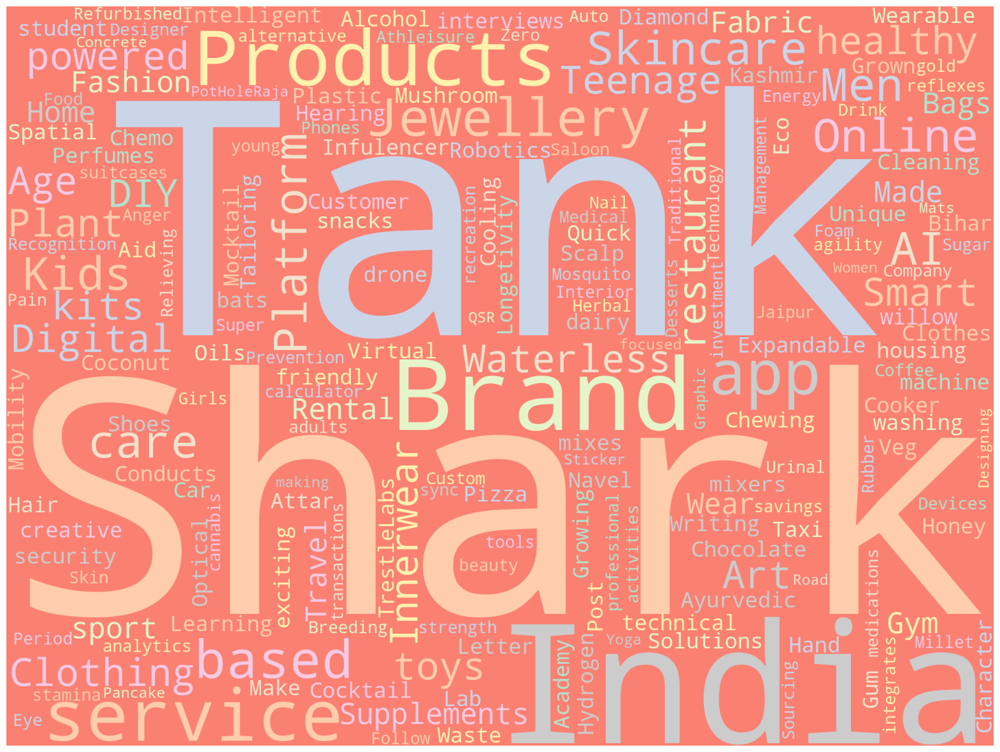

In [88]:
# Word cloud based on Business Description, startups came in current/latest season (3rd season)
text = " Shark Tank India ".join(cat for cat in shark_tank_season3.loc[shark_tank_season3['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(20,16))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [89]:
# Correlation matrix
shark_tank.corr(numeric_only=True).style.background_gradient(cmap = 'Blues')

,Season Number,Episode Number,Pitch Number,Started in,Number of Presenters,Male Presenters,Female Presenters,Transgender Presenters,Couple Presenters,Yearly Revenue,Monthly Sales,Gross Margin,Net Margin,EBITDA,SKUs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Total Deal Amount,Total Deal Equity,Total Deal Debt,Debt Interest,Deal Valuation,Number of Sharks in Deal,Royalty Deal,Advisory Shares Equity,Namita Investment Amount,Namita Investment Equity,Namita Debt Amount,Vineeta Investment Amount,Vineeta Investment Equity,Vineeta Debt Amount,Anupam Investment Amount,Anupam Investment Equity,Anupam Debt Amount,Aman Investment Amount,Aman Investment Equity,Aman Debt Amount,Peyush Investment Amount,Peyush Investment Equity,Peyush Debt Amount,Amit Investment Amount,Amit Investment Equity,Amit Debt Amount,Ashneer Investment Amount,Ashneer Investment Equity,Ashneer Debt Amount,Guest Investment Amount,Guest Investment Equity,Guest Debt Amount,Namita Present,Vineeta Present,Anupam Present,Aman Present,Peyush Present,Amit Present,Ashneer Present,Guest Present
Season Number,1.000000,0.070865,0.930259,0.211071,-0.050906,0.006773,0.011543,nan,-0.023268,0.170922,0.209913,0.023251,-0.229794,nan,-0.118034,-0.047460,-0.229411,0.103199,0.080420,0.113557,0.226672,-0.420240,0.029747,0.048577,0.334919,-0.078454,nan,nan,0.185547,-0.252424,0.209080,0.435053,-0.510963,-0.241128,0.311566,-0.360317,0.080488,0.133001,-0.311548,0.048384,0.214913,-0.269024,0.480248,0.071468,-0.137022,nan,nan,nan,nan,0.351441,-0.394027,-0.200656,nan,nan,nan,nan,nan,nan,nan,0.313153
Episode Number,0.070865,1.000000,0.308429,-0.026431,0.050392,0.083134,0.026409,nan,-0.013309,0.054387,0.022468,0.010439,0.249002,-0.157783,0.265083,-0.029207,-0.062580,0.047798,-0.012417,0.052478,-0.065738,-0.082912,-0.043784,0.203519,-0.011528,0.025850,nan,-0.989457,-0.050036,-0.038781,-0.290107,-0.092979,-0.253987,-0.176177,-0.126111,-0.160815,-0.738190,-0.012263,-0.137798,-0.421661,-0.046795,0.026202,0.185670,-0.166386,-0.240255,0.950895,-0.266455,-0.182477,1.000000,-0.304467,0.005992,0.303414,nan,nan,nan,nan,nan,nan,nan,-0.141565
Pitch Number,0.930259,0.308429,1.000000,0.200520,-0.038637,0.011635,-0.028251,nan,-0.014379,0.184794,0.206754,0.020054,-0.160526,-0.145393,-0.065897,-0.063108,-0.211210,0.101703,-0.015246,0.069256,0.193539,-0.420761,0.005596,0.189975,0.312431,-0.062528,nan,-0.997631,0.146313,-0.238741,-0.124559,0.383248,-0.577962,-0.297457,0.248028,-0.383489,-0.119178,0.117252,-0.331013,-0.148595,0.200883,-0.250985,0.460870,-0.038944,-0.320047,0.953064,-0.261785,-0.163796,1.000000,0.299025,-0.444009,0.137222,nan,nan,nan,nan,nan,nan,nan,0.309107
Started in,0.211071,-0.026431,0.200520,1.000000,-0.064501,0.055123,0.029948,nan,-0.182375,-0.105458,-0.063816,0.394897,0.300254,-0.095188,-0.344295,-0.106658,-0.067778,-0.080008,0.122722,0.144097,0.027400,-0.039809,-0.097853,0.130744,-0.040351,0.136208,nan,0.796448,-0.198516,-0.263538,-0.555500,-0.146766,-0.014760,0.331232,0.122837,0.021916,0.421045,-0.147109,-0.085820,-0.200028,-0.281631,-0.114889,0.071980,-0.338557,0.008745,-1.000000,0.145770,-0.332778,1.000000,0.382641,0.056717,0.075094,nan,nan,nan,nan,nan,nan,nan,0.083611
Number of Presenters,-0.050906,0.050392,-0.038637,-0.064501,1.000000,0.756849,0.317231,nan,0.162496,0.021169,-0.003003,-0.195097,0.072911,-0.421927,-0.014128,-0.057082,-0.147397,0.060850,0.024906,-0.054490,0.086626,-0.205074,0.289332,0.211060,0.114886,0.058829,nan,-0.880812,-0.007874,-0.085358,-0.245928,0.145245,-0.209295,-0.285549,0.122679,-0.251477,0.207778,0.109664,0.018779,0.374108,0.022402,-0.277039,0.501527,-0.267185,-0.119763,0.800757,-0.078089,-0.278986,nan,-0.050714,-0.217961,nan,nan,nan,nan,nan,nan,nan,nan,-0.011003
Male Presenters,0.006773,0.083134,0.011635,0.055123,0.756849,1.000000,0.041584,nan,-0.327770,0.051441,0.028878,-0.104646,0.129315,-0.297381,0.116338,-0.040795,-0.162669,0.062442,0.019427,0.056857,0.087304,-0.144506,0.334831,0.139100,0.186353,0.061789,nan,

In [90]:
print("numpy version: {}". format(np.__version__))
print("pandas version: {}". format(pd.__version__))
import matplotlib
print("matplotlib version: {}". format(matplotlib. __version__))
print("seaborn version: {}". format(sns.__version__))
import plotly
print("plotly version: {}". format(plotly.__version__))

# Current Python package versions
# numpy version: 1.26.4
# pandas version: 2.2.0
# matplotlib version: 3.7.5
# seaborn version: 0.12.2
# plotly version: 5.18.0

numpy version: 1.24.3
pandas version: 2.0.3
matplotlib version: 3.7.2
seaborn version: 0.12.2
plotly version: 5.9.0
